# Analysis of Lung LPS and tabula Senis data

In this Notebook the single cell RNAseq data from Zhang, L. et al. Single-cell transcriptomic profiling of lung endothelial cells identifies dynamic inflammatory and regenerative subpopulations. JCI Insight 7, (2022) is primarily analyzed.

The Motivation was to see how Aplnr expression reacts the the inflammation stimulus given and if senescence processes are initated in the endothelial cells. 



In [1]:
import scanpy as sc
import yaml
import os
import pandas as pd
import numpy as np
import decoupler as dc
import sccoda
import pertpy as pt
os.environ['HTTP_PROXY']="http://www-int.dkfz-heidelberg.de:80"
os.environ['HTTPS_PROXY']="http://www-int.dkfz-heidelberg.de:80"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 12.0 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
  Created wheel for ete3: filename=ete3-3.1.3-py3-none-any.whl size=2273786 sha256=6eb8a510d0f1e24b44960855a144d4ef1767a9af53fc2257c0212f1e5f3081bb
  Stored in directory: /home/heyer/.cache/pip/wheels/a0/72/00/1982bd848e52b03079dbf800900120bc1c20e92e9a1216e525
Successfully built ete3
Note: you may need to restart the kernel to use updated packages.


In [2]:
with open("configs/lung_lps.yaml", "r") as stream:
    try:
        config=yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

In [3]:



paths = [os.path.join(config["BASE_FP"], config["DATASET"], sample, "anndata", "adata_norm_processed.h5ad") for sample in config["samples"].keys()]

adata = list(map(sc.read_h5ad, paths))


## Full Dataset

We satrt off by analyzing these data by loading an adata object of all cells and adding the cluster annotaions by the authors (provided upon request)

Then we add the "immunec" and devEC populations based on the marker genes described in the paper above to assign the clusters to the cell tyes described.


The we plot the UMAPS

In [4]:
adata_big=sc.read_h5ad("/omics/odcf/analysis/OE0228_projects/VascularAging/rna_sequencing/public_scrnaseq/lung_lps/merged/anndata/adata_merged.h5ad")

In [5]:
sample_names = ["basal", "Hour6","Day1", "Day2", "Day3", "Day7"]
labels = dict()
for s_name in sample_names:
    labels[s_name] = pd.read_csv(f"./data/lunglps/{s_name}_label.csv").set_index("Unnamed: 0")
    

In [6]:
labels["basal"] = labels["basal"].replace({1: "immunec", 2: "devEC", 3: "Aerocyte"})
labels["Hour6"] = labels["Hour6"].replace({1: "immunec", 2: "devEC", 3: "Aerocyte"})
labels["Day1"] = labels["Day1"].replace({1: "immunec", 2: "devEC", 3: "Aerocyte"})
labels["Day2"] = labels["Day2"].replace({1: "immunec", 2: "devEC", 4: "Aerocyte"})
labels["Day3"] = labels["Day3"].replace({1: "immunec", 3: "proEC", 2: "Aerocyte"})
labels["Day7"] = labels["Day7"].replace({1: "immunec", 2: "devEC", 4: "Aerocyte"})
labels_all = pd.concat(labels)
labels_all=labels_all.reset_index()
labels_all=labels_all.rename(columns={"level_0": "samples","Unnamed: 0": "cell_id"})


In [36]:
labels_all["cell_type"] = labels_all["Clusters"]

labels_all["cell_type"] = labels_all["cell_type"].replace({"devEC": "devEC/proEC", "proEC": "devEC/proEC"})

labels_all["cell_type"] = labels_all["cell_type"].where(labels_all["cell_type"].isin(["devEC/proEC", "Aerocyte", "immunec"])).replace({np.nan: "other"})


In [7]:
labels_all=labels_all.set_index("cell_id")

In [38]:
adata_big.obs["Clusters"] = labels_all["Clusters"]
adata_big.obs["cell_type"] = labels_all["cell_type"]
adata_big.obs["Clusters"][adata_big.obs["Clusters"].isnull()] = "missing"

sc.pp.neighbors(adata_big)
sc.tl.umap(adata_big)

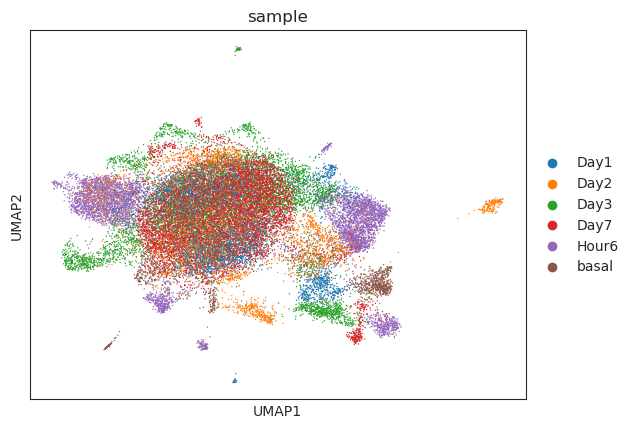

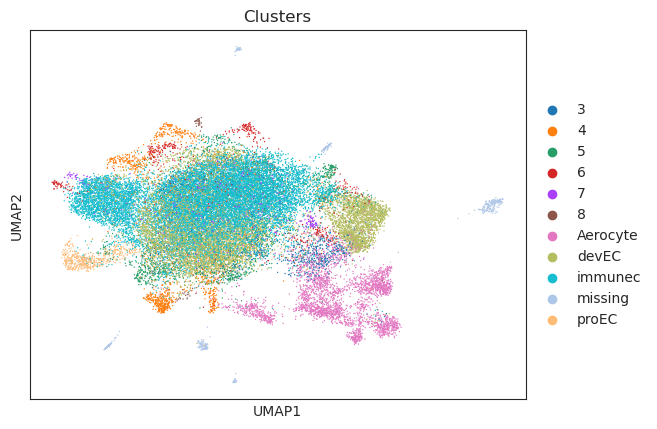

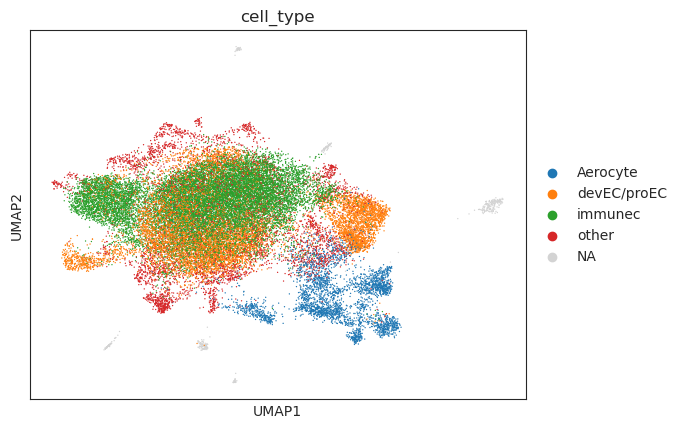

In [51]:
adata_big.obs["Clusters"] = adata_big.obs["Clusters"].astype("category")
sc.pl.umap(
    adata_big,
    color=["sample"]
)
sc.pl.umap(adata_big, color = "Clusters")
sc.pl.umap(adata_big, color = "cell_type")

These first wo UMAPS above show cells from all expreiments and the clusters annotated from in the second figure. 

Aerocytes cljuster separately to all other cells. Among the other ECs Hour6 both devEC and ImmuneEC populations cluster away -> Whereas in the other data these cell types seem to cluster in one large cluster in the middle. 

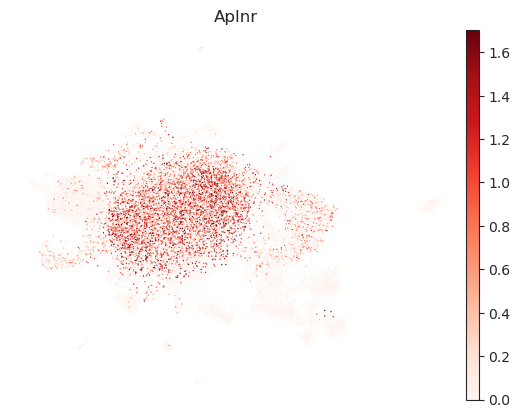

In [10]:
sc.pl.umap(
    adata_big, 
    color=["Aplnr"],     
    vmin=0,
    vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
    sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
    frameon=False,
    cmap="Reds")
        

## Compositional Analysis

Analyze the composition of the annoated EC cell types to track the changes. 


In [11]:
import sccoda
import pertpy as pt


In [39]:
sccoda_model = pt.tl.Sccoda()
sccoda_data = sccoda_model.load(
    adata_big,
    type="cell_level",
    cell_type_identifier="cell_type",
    sample_identifier="sample",
)
sccoda_data

MuData object with n_obs × n_vars = 32137 × 12819
  2 modalities
    rna:	32131 x 12815
      obs:	'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'Clusters', 'scCODA_sample_id', 'cell_type'
      uns:	'neighbors', 'umap', 'sample_colors', 'Clusters_colors'
      obsm:	'X_pca', 'X_umap'
      layers:	'analytic_pearson_residuals', 'counts', 'log1p_norm', 'scran_normalization', 'soupX_counts'
      obsp:	'distances', 'connectivities'
    coda:	6 x 4
      obs:	'sample'
      var:	'n_cells'

<Axes: xlabel='Cell type', ylabel='Proportion'>

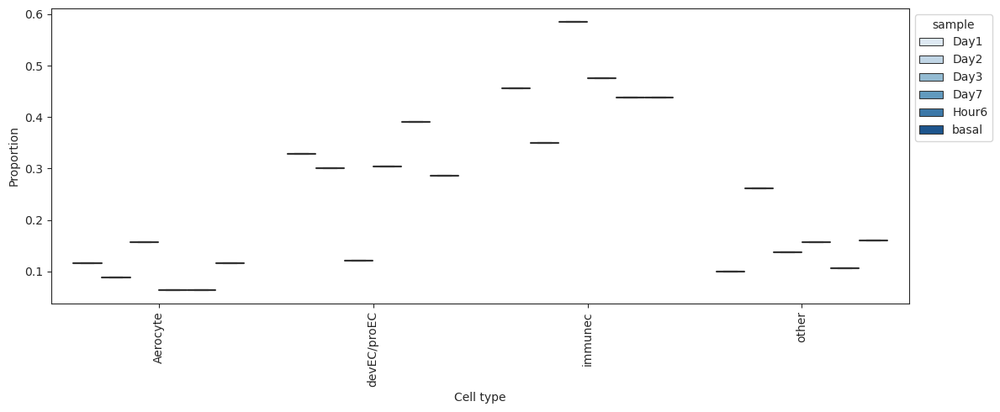

In [40]:
pt.pl.coda.boxplots(
    sccoda_data,
    modality_key="coda",
    feature_name="sample",
    figsize=(12, 5),
    add_dots=False,
    args_swarmplot={"palette": ["red"]},
)


<Axes: title={'center': 'sample'}, ylabel='Proportion'>

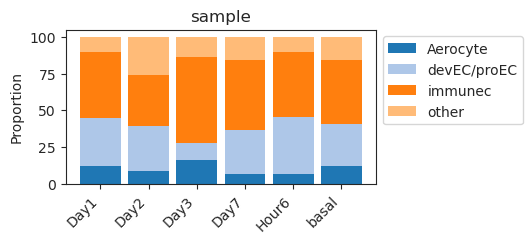

In [41]:
pt.pl.coda.stacked_barplot(
    sccoda_data, modality_key="coda", feature_name="sample", figsize=(4, 2),
)

Aplnr Expression is primarily in the center cluster with some expression in the DevEC and immuneEC cluster in the center of the image. 

## Get Annotations

Functional annotations are added from MSIGDB and we also create a subdataset with signatures from FRIDMAN_SENSCENCE_UP/DN

In [11]:
msigdb=pd.read_csv("resources/msig_mouse.csv.gz")
msig_small=msigdb[["genesymbol","geneset"]].drop_duplicates()


In [12]:
senscence = msig_small[msig_small['geneset'].isin(['FRIDMAN_SENESCENCE_UP', 'FRIDMAN_SENESCENCE_DN'])]

In [13]:
import pandas as pd

# Define the URL of the TSV file
url = "http://www.informatics.jax.org/downloads/reports/HMD_HumanPhenotype.rpt"

# Define the column names for the dataframe
col_names = ["hgene","hID", "mgene", "mID", "lcol", "ncol"]

# Use pandas to read the TSV file into a dataframe
mouse_human_homologs = pd.read_csv(url, sep="\t", header = None, index_col=None)
mouse_human_homologs.columns = col_names
# Print the first few rows of the dataframe


### EC.SENESCENCE.SIG 

THe gene list below was taken from Wu, Z., Uhl, B., Gires, O. & Reichel, C. A. A transcriptomic pan-cancer signature for survival prognostication and prediction of immunotherapy response based on endothelial senescence. J Biomed Sci 30, 1–19 (2023).
where a pan-cancer transriptome signature for EC senscence is descrbied. -> We checked its activitiy in this dataset to asses it versus other known senescence indicators. 

We translate the genes to the human homologs to start off. and then add it to our senescence signature of interest. 

In [14]:
import pandas as pd

# List of genes as a Python Series
gene_series = [
    "FERMT2", "PLXNA2", "FLT1", "CAV2", "ICAM2", "GALNT18", "LAMA4", "SPARC", "PCDH12",
    "PLEKHG1", "MYCT1", "EFNB2", "CD93", "RHOJ", "KDR", "PODXL", "DLL4", "DOCK6", "PLVAP",
    "TMEM204", "NES", "COL4A2", "HECW2", "DUSP6", "ACVRL1", "PTPRG", "ESAM", "PRSS23", "GJA1",
    "AFAP1L1", "STC1", "COX7A1", "ITGA5", "BCL6B", "IGFBP7", "TM4SF18", "DLC1", "JCAD", "CYYR1",
    "SYNPO", "MMRN2", "CD34", "FZD4", "A2M", "CAVIN1", "CDH5", "IL3RA", "BCAM", "COL4A1",
    "S100A16", "TCF4", "TGM2", "BMPR2", "SCARF1", "ECE1", "PLK2", "RHOC", "SERPINH1", "INSR",
    "IPO11", "MAGI1", "NID1", "MECOM", "UACA", "TUBB6", "LMO2", "NECTIN2", "GRB10", "LAMA5",
    "LUZP1", "MAST4", "DYSF", "PNP", "NRP1", "CAVIN3", "LRRC8A", "EFNA1", "NFIA", "EHD4",
    "TNFAIP1", "PLXND1", "LAMB1", "RGS3", "ZEB1", "TRIOBP", "FSCN1", "YES1", "JAG1", "PEA15",
    "RAB13", "PHACTR2", "LAMC1", "VWA1", "PPIC", "SLC44A2", "PLEKHA1", "TPM4", "GNAI2", "MGLL",
    "UTRN", "CAPNS1"
]

# Print the Series 
print(gene_series)


['FERMT2', 'PLXNA2', 'FLT1', 'CAV2', 'ICAM2', 'GALNT18', 'LAMA4', 'SPARC', 'PCDH12', 'PLEKHG1', 'MYCT1', 'EFNB2', 'CD93', 'RHOJ', 'KDR', 'PODXL', 'DLL4', 'DOCK6', 'PLVAP', 'TMEM204', 'NES', 'COL4A2', 'HECW2', 'DUSP6', 'ACVRL1', 'PTPRG', 'ESAM', 'PRSS23', 'GJA1', 'AFAP1L1', 'STC1', 'COX7A1', 'ITGA5', 'BCL6B', 'IGFBP7', 'TM4SF18', 'DLC1', 'JCAD', 'CYYR1', 'SYNPO', 'MMRN2', 'CD34', 'FZD4', 'A2M', 'CAVIN1', 'CDH5', 'IL3RA', 'BCAM', 'COL4A1', 'S100A16', 'TCF4', 'TGM2', 'BMPR2', 'SCARF1', 'ECE1', 'PLK2', 'RHOC', 'SERPINH1', 'INSR', 'IPO11', 'MAGI1', 'NID1', 'MECOM', 'UACA', 'TUBB6', 'LMO2', 'NECTIN2', 'GRB10', 'LAMA5', 'LUZP1', 'MAST4', 'DYSF', 'PNP', 'NRP1', 'CAVIN3', 'LRRC8A', 'EFNA1', 'NFIA', 'EHD4', 'TNFAIP1', 'PLXND1', 'LAMB1', 'RGS3', 'ZEB1', 'TRIOBP', 'FSCN1', 'YES1', 'JAG1', 'PEA15', 'RAB13', 'PHACTR2', 'LAMC1', 'VWA1', 'PPIC', 'SLC44A2', 'PLEKHA1', 'TPM4', 'GNAI2', 'MGLL', 'UTRN', 'CAPNS1']


In [15]:
mouse_genes = mouse_human_homologs[mouse_human_homologs["hgene"].isin(gene_series)]
mouse_genes

,hgene,hID,mgene,mID,lcol,ncol
2,A2M,2,A2m,MGI:2449119,NaN,NaN
256,ACVRL1,94,Acvrl1,MGI:1338946,"MP:0003631, MP:0005369, MP:0005370, MP:0005376...",NaN
421,AFAP1L1,134265,Afap1l1,MGI:2147199,NaN,NaN
1604,BCAM,4059,Bcam,MGI:1929940,NaN,NaN
1640,BCL6B,255877,Bcl6b,MGI:1278332,"MP:0005384, MP:0005387, MP:0005397",NaN
...,...,...,...,...,...,...
25215,UACA,55075,Uaca,MGI:1919815,"MP:0002006, MP:0005367, MP:0005370, MP:0005376...",NaN
25743,UTRN,7402,Utrn,MGI:104631,"MP:0003631, MP:0005376, MP:0010768",NaN
25937,VWA1,64856,Vwa1,MGI:2179729,"MP:0003631, MP:0005386",NaN
26170,YES1,7525,Yes1,MGI:99147,NaN,NaN


In [16]:
mouse_genes

,hgene,hID,mgene,mID,lcol,ncol
2,A2M,2,A2m,MGI:2449119,NaN,NaN
256,ACVRL1,94,Acvrl1,MGI:1338946,"MP:0003631, MP:0005369, MP:0005370, MP:0005376...",NaN
421,AFAP1L1,134265,Afap1l1,MGI:2147199,NaN,NaN
1604,BCAM,4059,Bcam,MGI:1929940,NaN,NaN
1640,BCL6B,255877,Bcl6b,MGI:1278332,"MP:0005384, MP:0005387, MP:0005397",NaN
...,...,...,...,...,...,...
25215,UACA,55075,Uaca,MGI:1919815,"MP:0002006, MP:0005367, MP:0005370, MP:0005376...",NaN
25743,UTRN,7402,Utrn,MGI:104631,"MP:0003631, MP:0005376, MP:0010768",NaN
25937,VWA1,64856,Vwa1,MGI:2179729,"MP:0003631, MP:0005386",NaN
26170,YES1,7525,Yes1,MGI:99147,NaN,NaN


In [17]:
EC_sig = pd.DataFrame({"genesymbol": mouse_genes.mgene, "geneset": "ec_Senescence_sig"})

In [18]:
full_sen =pd.concat([senscence, EC_sig])

In [19]:
hallmarks = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
hallmarks = hallmarks[~hallmarks.duplicated(['geneset', 'genesymbol'])]
hallmarks

,uniprot,genesymbol,entity_type,collection,geneset
233,O54791,Maff,protein,hallmark,HALLMARK_IL2_STAT5_SIGNALING
250,O54791,Maff,protein,hallmark,HALLMARK_COAGULATION
270,O54791,Maff,protein,hallmark,HALLMARK_HYPOXIA
373,O54791,Maff,protein,hallmark,HALLMARK_TNFA_SIGNALING_VIA_NFKB
377,O54791,Maff,protein,hallmark,HALLMARK_COMPLEMENT
...,...,...,...,...,...
3899655,O08599,Stxbp1,protein,hallmark,HALLMARK_PANCREAS_BETA_CELLS
3900302,Q9ER73,Elp4,protein,hallmark,HALLMARK_PANCREAS_BETA_CELLS
3900513,P55095,Gcg,protein,hallmark,HALLMARK_PANCREAS_BETA_CELLS
3900718,P21661,Pcsk2,protein,hallmark,HALLMARK_PANCREAS_BETA_CELLS


In [20]:
adata_big.X = adata_big.layers["scran_normalization"]

In [21]:
adata_big.layers

Layers with keys: analytic_pearson_residuals, counts, log1p_norm, scran_normalization, soupX_counts

In [22]:
dc.run_ora(
    mat=adata_big,
    net=pd.concat([hallmarks, full_sen]),
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False
)

Running ora on mat with 32131 samples and 12815 targets for 53 sources.


100%|██████████| 32131/32131 [00:37<00:00, 860.19it/s]
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


In [23]:
dc.run_aucell(
    mat=adata_big,
    net=pd.concat([hallmarks, full_sen]),
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False
)

Running aucell on mat with 32131 samples and 12815 targets for 53 sources.


In [24]:
labels_all.index = labels_all.index.to_flat_index()

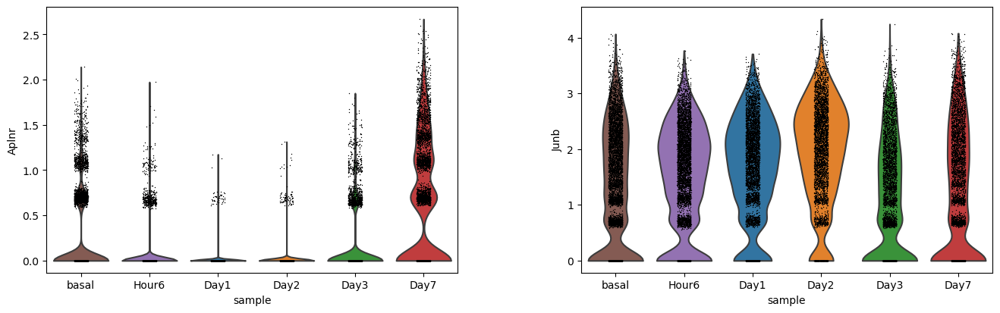

cell_id
Day0_AAACCTGAGGGTCGAT-1    immunec
Day0_AAACCTGAGTCAAGGC-1    immunec
Day0_AAACCTGAGTTACGGG-1    immunec
Day0_AAACCTGAGTTAGGTA-1    immunec
Day0_AAACCTGCACAGACTT-1    immunec
                            ...   
Day7_TTTGTCATCATGTAGC-1    immunec
Day7_TTTGTCATCCAGTATG-1          3
Day7_ACGCAGCGTCATCCCT-1    missing
Day7_CGGGTCATCAAACCAC-1    missing
Day7_GTCTCGTCACATGGGA-1    missing
Name: Clusters, Length: 32131, dtype: category
Categories (11, object): [3, 4, 5, 6, ..., 'devEC', 'immunec', 'missing', 'proEC']

In [82]:
adata_big
sc.pl.violin(adata_big, keys = ["Aplnr", "Junb"], groupby = "sample", order=sample_names)
adata_big.obs["Clusters"]

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


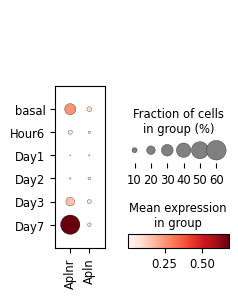

In [86]:
sc.pl.dotplot(adata_big, var_names = ["Aplnr", "Apln"], groupby = "sample", categories_order = sample_names)

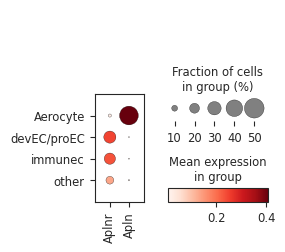

In [49]:
adata_big.obs["sample_cluster"] = adata_big.obs["sample"].astype("str") + "_" + adata_big.obs["cell_type"].astype("str")

sc.pl.dotplot(adata_big, var_names = ["Aplnr", "Apln"], groupby = "cell_type")

cell_id
Day0_AAACCTGAGGGTCGAT-1    basal_immunec
Day0_AAACCTGAGTCAAGGC-1    basal_immunec
Day0_AAACCTGAGTTACGGG-1    basal_immunec
Day0_AAACCTGAGTTAGGTA-1    basal_immunec
Day0_AAACCTGCACAGACTT-1    basal_immunec
                               ...      
Day7_TTTGTCATCATGTAGC-1     Day7_immunec
Day7_TTTGTCATCCAGTATG-1       Day7_other
Day7_ACGCAGCGTCATCCCT-1         Day7_nan
Day7_CGGGTCATCAAACCAC-1         Day7_nan
Day7_GTCTCGTCACATGGGA-1         Day7_nan
Length: 32131, dtype: object

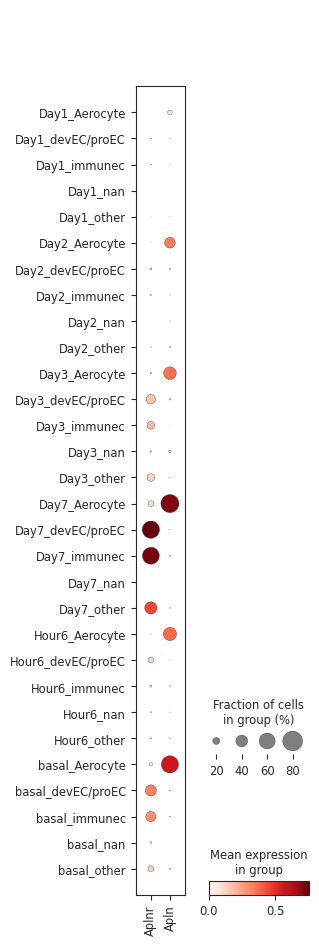

In [50]:
sc.pl.dotplot(adata_big, var_names = ["Aplnr", "Apln"], groupby = "sample_cluster")

Here we clearly see that Aplnr Expression is present at the start but after treatment with LPS drops to almost 0 by day1. However by Day7 -> Aplnr Expression increases and overshoots the expression from the start of the experiment

Lastly, we have som extra plots below with alternative color schemes and looking at Aplnr Expression across the different cell types. 

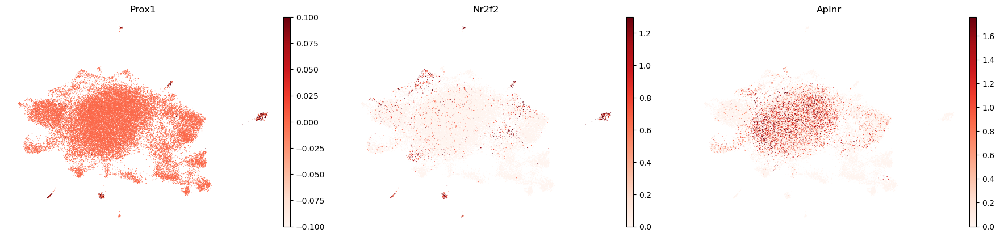

In [26]:
sc.pl.umap(
    adata_big,
    color=["Prox1","Nr2f2", "Aplnr"],     
    vmin=0,
    vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
    sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
    frameon=False,
    cmap="Reds"
)


In [27]:
adata_big

AnnData object with n_obs × n_vars = 32131 × 12815
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'Clusters'
    uns: 'neighbors', 'umap', 'sample_colors', 'Clusters_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals', 'aucell_estimate'
    layers: 'analytic_pearson_residuals', 'counts', 'log1p_norm', 'scran_normalization', 'soupX_counts'
    obsp: 'distances', 'connectivities'

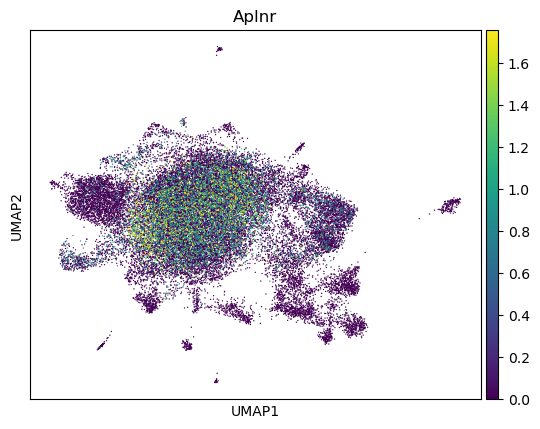

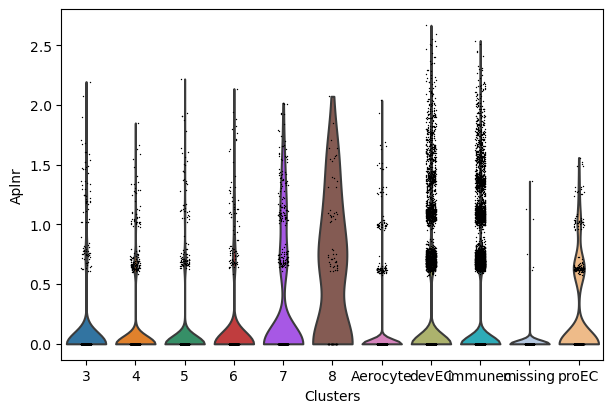

In [28]:
sc.pl.umap(
    adata_big,
    color=["Aplnr"],
    vmax="p99"
)
sc.pl.violin(
    adata_big,
    keys= ["Aplnr"],
    groupby="Clusters"
)

## Enrichments for adata big Lung lps

To get a better understanding of the data, we performed an over representation analysis (using decoupler-py) against the HALLMARK gene sets from Msigdb, FRIDMAN_SENESCENCE_UP/DN and the EC.SENESCENCE.SIG signature.




### Enrichment using ORA tests


In [29]:
adata_big.X = np.nan_to_num(adata_big.X)

In [96]:
acts = dc.get_acts(adata_big, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts



acts.obsm["ora_estimate"].columns

Index(['FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP',
       'HALLMARK_ADIPOGENESIS', 'HALLMARK_ALLOGRAFT_REJECTION',
       'HALLMARK_ANDROGEN_RESPONSE', 'HALLMARK_ANGIOGENESIS',
       'HALLMARK_APICAL_JUNCTION', 'HALLMARK_APICAL_SURFACE',
       'HALLMARK_APOPTOSIS', 'HALLMARK_BILE_ACID_METABOLISM',
       'HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'HALLMARK_COAGULATION',
       'HALLMARK_COMPLEMENT', 'HALLMARK_DNA_REPAIR', 'HALLMARK_E2F_TARGETS',
       'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION',
       'HALLMARK_ESTROGEN_RESPONSE_EARLY', 'HALLMARK_ESTROGEN_RESPONSE_LATE',
       'HALLMARK_FATTY_ACID_METABOLISM', 'HALLMARK_G2M_CHECKPOINT',
       'HALLMARK_GLYCOLYSIS', 'HALLMARK_HEDGEHOG_SIGNALING',
       'HALLMARK_HEME_METABOLISM', 'HALLMARK_HYPOXIA',
       'HALLMARK_IL2_STAT5_SIGNALING', 'HALLMARK_IL6_JAK_STAT3_SIGNALING',
       'HALLMARK_INFLAMMATORY_RESPONSE', 'HALLMARK_INTERFERON_ALPHA_RESPONSE',
       'HALLMARK_INTERFERON_GAMMA_RESPONSE', 'HALLMARK_KRAS_SIGNALING_DN',
     

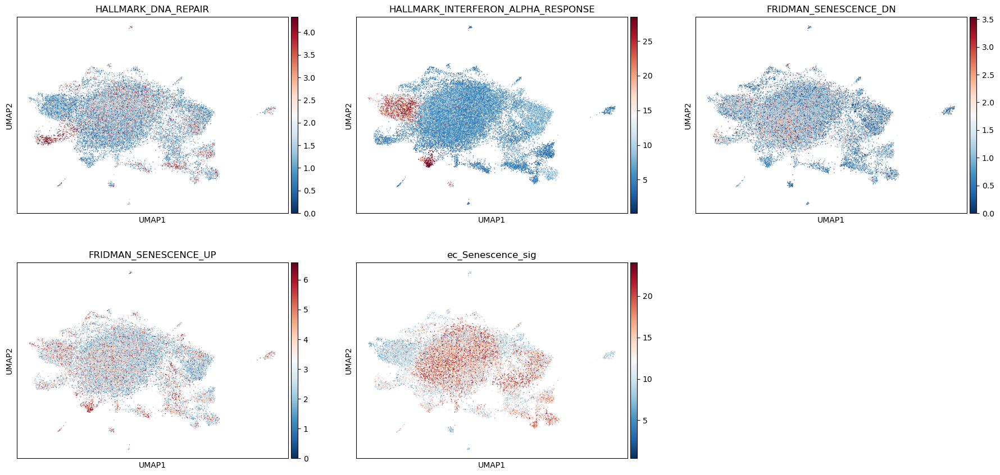

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


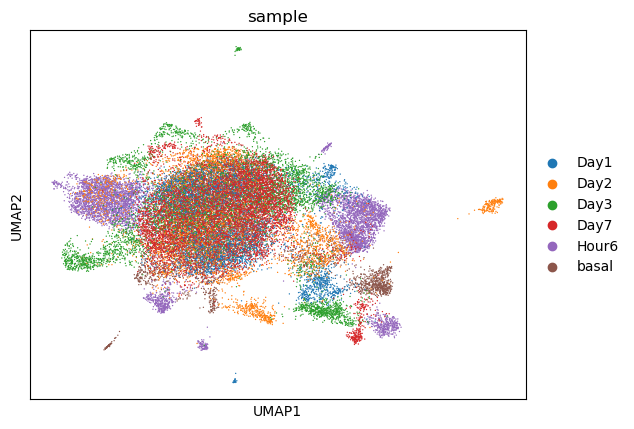

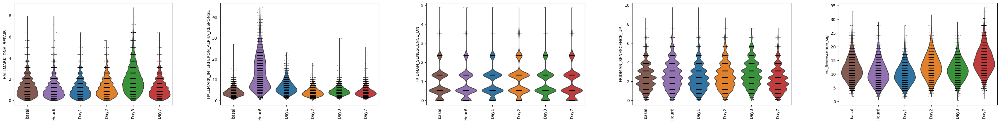

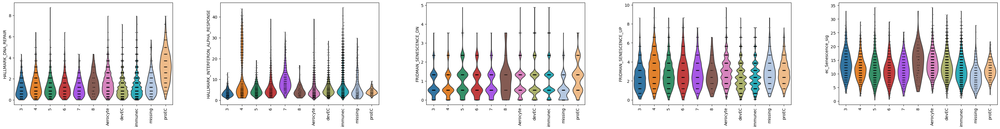

In [98]:
gs_of_interest = ['HALLMARK_DNA_REPAIR', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 
                        'FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP', 'ec_Senescence_sig']
sc.pl.umap(acts, color=gs_of_interest, cmap='RdBu_r',vmax = "p99",ncols=3)
sc.pl.umap(acts, color="sample")

sc.pl.violin(acts, keys=gs_of_interest, groupby='sample', rotation=90, multi_panel=True,order =["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"] )
sc.pl.violin(acts, keys=gs_of_interest, groupby='Clusters', rotation=90, multi_panel=True )


Here we the activity of some selected gene sets in these data. 
. First we have the per cell Enrichment between six gene sets. After Stimulus at Hour6 Intereron Response Increases due ot the DNA Damage. DNA Repair is active in a subset of proECs at day3. 

The Senescene signatures show now clear signs in the UMAP, however in the Violin plots we see some evidence that the EC Senescence signature falls a bit during inflammation and is increased by day7. HOwever the picture is not very clear here. 

Next we rank the group sources by testing if the change between one samples vs all other samples is significant in some of the gene sets. 

We than take the top five per group and produce the matrix plot below. 

In [105]:
df = dc.rank_sources_groups(acts, groupby='sample', reference='basal', method='t-test_overestim_var')
df

df_basal = dc.rank_sources_groups(acts, groupby='sample', reference='basal', method='t-test_overestim_var')



In [106]:
df_basal

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,Day1,basal,HALLMARK_INTERFERON_GAMMA_RESPONSE,69.132751,4.901423,0.0,0.0
1,Day1,basal,HALLMARK_TNFA_SIGNALING_VIA_NFKB,62.695917,6.501327,0.0,0.0
2,Day1,basal,HALLMARK_HYPOXIA,58.842807,2.896211,0.0,0.0
3,Day1,basal,HALLMARK_INFLAMMATORY_RESPONSE,54.444963,1.528278,0.0,0.0
4,Day1,basal,HALLMARK_IL2_STAT5_SIGNALING,49.576510,1.427461,0.0,0.0
...,...,...,...,...,...,...,...
313,basal,basal,HALLMARK_HEDGEHOG_SIGNALING,0.000000,0.000000,1.0,1.0
314,basal,basal,HALLMARK_HEME_METABOLISM,0.000000,0.000000,1.0,1.0
315,basal,basal,HALLMARK_HYPOXIA,0.000000,0.000000,1.0,1.0
316,basal,basal,HALLMARK_IL2_STAT5_SIGNALING,0.000000,0.000000,1.0,1.0


In [107]:
n_markers = 5
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers =  {k: source_markers[k] for k in ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"]}

n_markers = 5
source_markers_basal = df_basal.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers_basal =  {k: source_markers_basal[k] for k in ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"]}




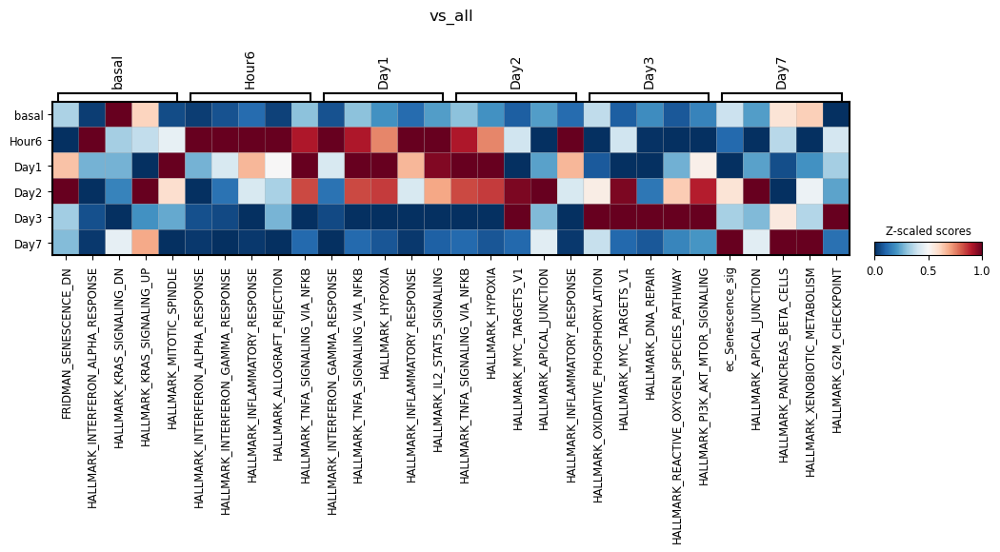

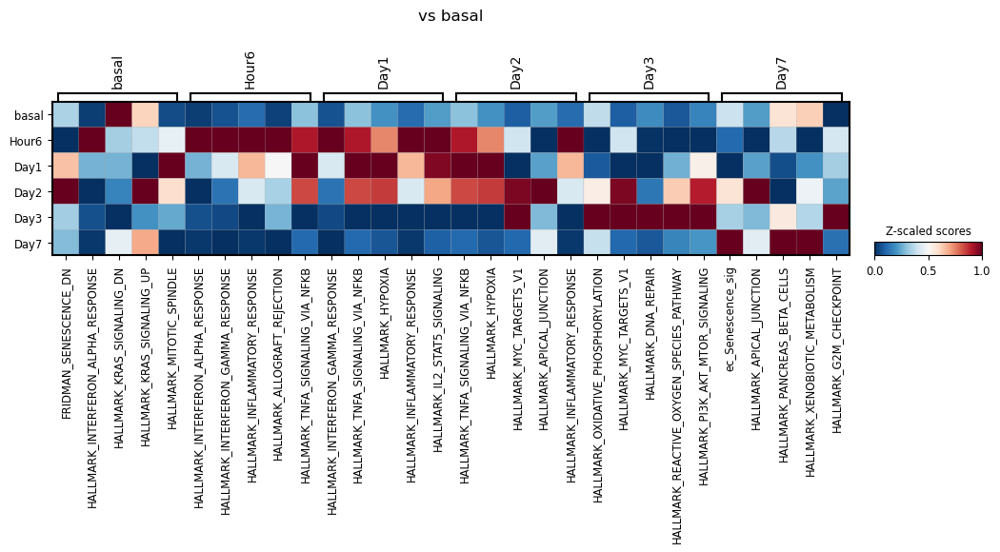

In [108]:
sc.pl.matrixplot(acts, source_markers, 'sample', dendrogram=False, title="vs_all",
                 colorbar_title='Z-scaled scores',standard_scale='var', cmap='RdBu_r',categories_order = ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"])

sc.pl.matrixplot(acts, source_markers, 'sample', dendrogram=False, title="vs basal",
                 colorbar_title='Z-scaled scores',standard_scale='var', cmap='RdBu_r',categories_order = ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"])

### Enrichments using AUcell

Here we use an alternative strategy for enrichment analysis. Since we have no weights assigned to genes we stuck to another method that doesn expect weighted gene sets (AUcell)

Plots are corresponding to the OR analysis. 


In [35]:
acts = dc.get_acts(adata_big, obsm_key='aucell_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts



acts.obsm["aucell_estimate"].columns

Index(['FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP',
       'HALLMARK_ADIPOGENESIS', 'HALLMARK_ALLOGRAFT_REJECTION',
       'HALLMARK_ANDROGEN_RESPONSE', 'HALLMARK_ANGIOGENESIS',
       'HALLMARK_APICAL_JUNCTION', 'HALLMARK_APICAL_SURFACE',
       'HALLMARK_APOPTOSIS', 'HALLMARK_BILE_ACID_METABOLISM',
       'HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'HALLMARK_COAGULATION',
       'HALLMARK_COMPLEMENT', 'HALLMARK_DNA_REPAIR', 'HALLMARK_E2F_TARGETS',
       'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION',
       'HALLMARK_ESTROGEN_RESPONSE_EARLY', 'HALLMARK_ESTROGEN_RESPONSE_LATE',
       'HALLMARK_FATTY_ACID_METABOLISM', 'HALLMARK_G2M_CHECKPOINT',
       'HALLMARK_GLYCOLYSIS', 'HALLMARK_HEDGEHOG_SIGNALING',
       'HALLMARK_HEME_METABOLISM', 'HALLMARK_HYPOXIA',
       'HALLMARK_IL2_STAT5_SIGNALING', 'HALLMARK_IL6_JAK_STAT3_SIGNALING',
       'HALLMARK_INFLAMMATORY_RESPONSE', 'HALLMARK_INTERFERON_ALPHA_RESPONSE',
       'HALLMARK_INTERFERON_GAMMA_RESPONSE', 'HALLMARK_KRAS_SIGNALING_DN',
     

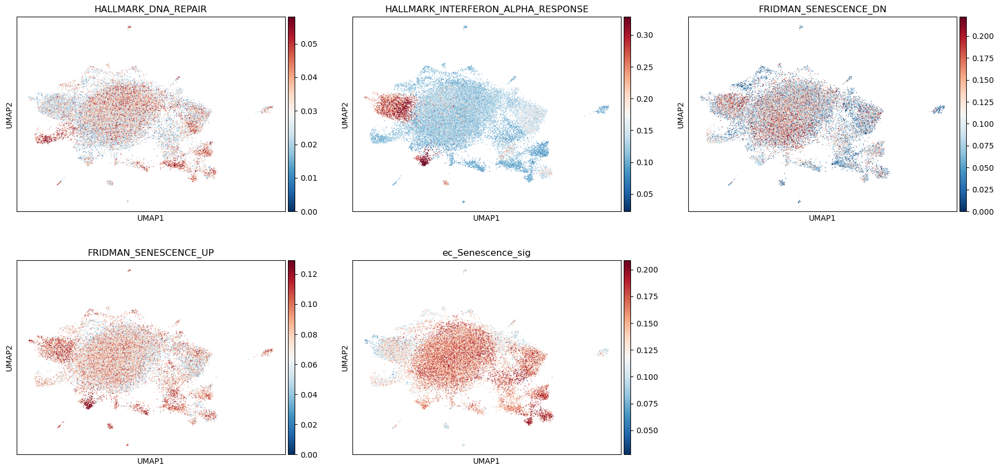

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


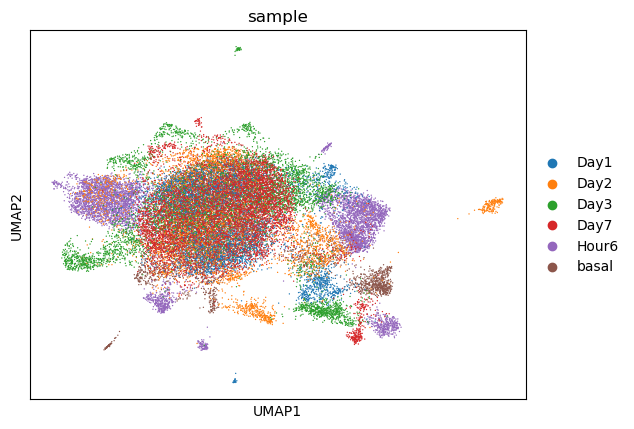

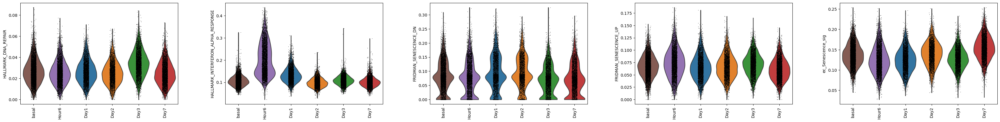

In [36]:
gs_of_interest = ['HALLMARK_DNA_REPAIR', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 
                        'FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP', 'ec_Senescence_sig']
sc.pl.umap(acts, color=gs_of_interest, cmap='RdBu_r',vmax = "p99",ncols=3)
sc.pl.umap(acts, color="sample")

sc.pl.violin(acts, keys=gs_of_interest, groupby='sample', rotation=90, multi_panel=True,order =["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"] )


In [37]:
acts

AnnData object with n_obs × n_vars = 32131 × 53
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'Clusters'
    uns: 'neighbors', 'umap', 'sample_colors', 'Clusters_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals', 'aucell_estimate'

In [110]:
df = dc.rank_sources_groups(acts, groupby='sample', reference='rest', method='t-test_overestim_var')
df
df_basal = dc.rank_sources_groups(acts, groupby='sample', reference='basal', method='t-test_overestim_var')
df_basal

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,Day1,basal,HALLMARK_INTERFERON_GAMMA_RESPONSE,69.132751,4.901423,0.0,0.0
1,Day1,basal,HALLMARK_TNFA_SIGNALING_VIA_NFKB,62.695917,6.501327,0.0,0.0
2,Day1,basal,HALLMARK_HYPOXIA,58.842807,2.896211,0.0,0.0
3,Day1,basal,HALLMARK_INFLAMMATORY_RESPONSE,54.444963,1.528278,0.0,0.0
4,Day1,basal,HALLMARK_IL2_STAT5_SIGNALING,49.576510,1.427461,0.0,0.0
...,...,...,...,...,...,...,...
313,basal,basal,HALLMARK_HEDGEHOG_SIGNALING,0.000000,0.000000,1.0,1.0
314,basal,basal,HALLMARK_HEME_METABOLISM,0.000000,0.000000,1.0,1.0
315,basal,basal,HALLMARK_HYPOXIA,0.000000,0.000000,1.0,1.0
316,basal,basal,HALLMARK_IL2_STAT5_SIGNALING,0.000000,0.000000,1.0,1.0


In [111]:
n_markers = 5
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers =  {k: source_markers[k] for k in ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"]}

source_markers_basal = df_basal.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers_basal =  {k: source_markers_basal[k] for k in ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"]}



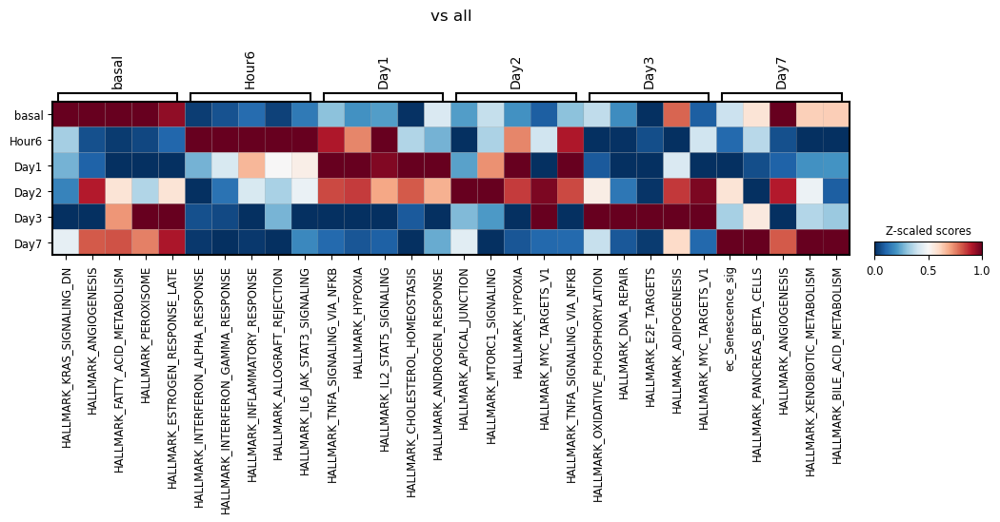

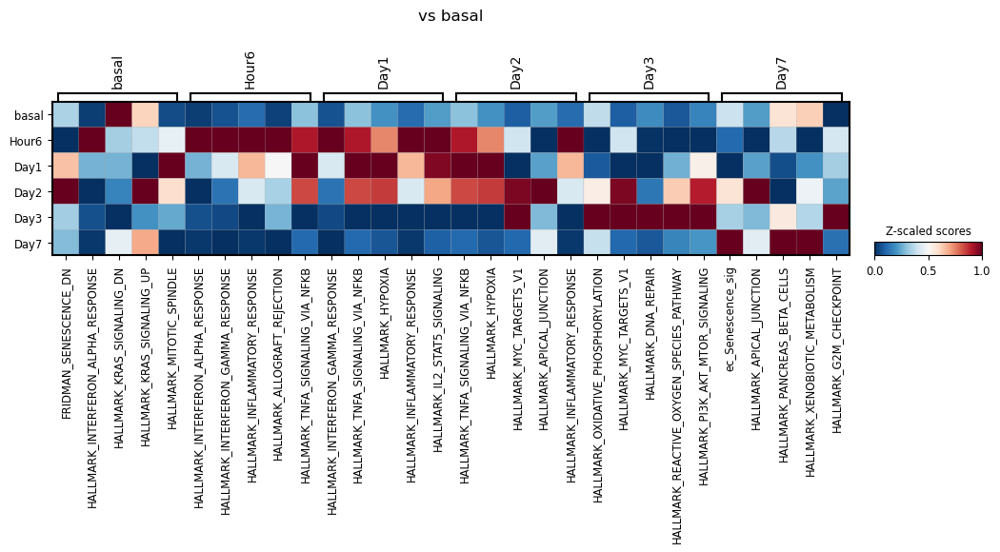

In [114]:
sc.pl.matrixplot(acts, source_markers, 'sample', dendrogram=False,standard_scale="var", title= "vs all",
                 colorbar_title='Z-scaled scores', cmap='RdBu_r', categories_order = ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"])

sc.pl.matrixplot(acts, source_markers_basal, 'sample', dendrogram=False,standard_scale="var", title = "vs basal",
                 colorbar_title='Z-scaled scores', cmap='RdBu_r', categories_order = ["basal", "Hour6", "Day1", "Day2", "Day3", "Day7"])

Enrichments usinsg AUCell are very similar to ORA -> So we refer to the ORA results. 

## Adata single test code

In this part we show the analysis we ran on each single group to have look at the expression in each sample to identfiy the cell subgroups. 

Not to relevant. 

In [41]:
adata_basal = sc.read_h5ad("/omics/odcf/analysis/OE0228_projects/VascularAging/rna_sequencing/public_scrnaseq/lung_lps/basal/anndata/adata_norm_processed.h5ad")

In [115]:
f_paths=[f"/omics/odcf/analysis/OE0228_projects/VascularAging/rna_sequencing/public_scrnaseq/lung_lps/{s_name}/anndata/adata_norm_processed.h5ad"for s_name in sample_names]



In [58]:
adata_dict = dict(zip(sample_names, adata))

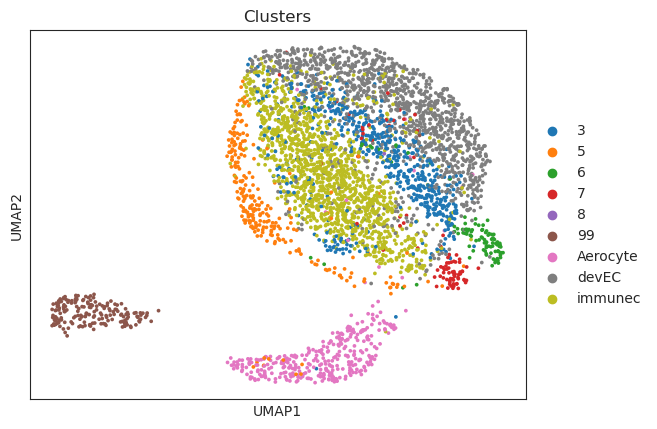

In [59]:
samp_name = "Day2"
check_pro_ecs = False

adata_obj = adata_dict[samp_name]
adata_obj.obs["Clusters"] = labels[samp_name]["Clusters"]
adata_obj.obs["Clusters"][adata_obj.obs["Clusters"].isnull()] = 99
adata_obj.obs["Clusters"] = adata_obj.obs["Clusters"].astype("category")
#sc.pp.neighbors(adata_obj,10)
#sc.tl.umap(adata_obj)
sc.pl.umap(
    adata_obj,
    color="Clusters",  
)

In [54]:
adata_obj.obs["Clusters"]

cell_id
Day2_AAACCTGCAGACAGGT-1    immunec
Day2_AAACCTGCAGGAATGC-1    immunec
Day2_AAACCTGCATGAGCGA-1          3
Day2_AAACCTGGTAAATGTG-1      devEC
Day2_AAACCTGTCCGCAAGC-1    immunec
                            ...   
Day2_TTGCGTCAGCATCATC-1         99
Day2_TTGCGTCGTAAGTTCC-1         99
Day2_TTGTAGGAGGTGATTA-1         99
Day2_TTTACTGTCGTAGATC-1         99
Day2_TTTGGTTTCCAAACAC-1         99
Name: Clusters, Length: 4127, dtype: category
Categories (9, object): [3, 5, 6, 7, ..., 99, 'Aerocyte', 'devEC', 'immunec']

In [55]:
marker_genes = {"immuneEC": ["Cd74", "H2-Aa", "H2-Ab1", "Irf7", "Icam1", "Il4ra"], 
                "devEC": ["Junb", "Egr1", "Sox17", "Kdr", "Ace"], 
                "Aerocyte": ["Car4", "Ednrb", "Emp2", "Itgb5"],
             }

if check_pro_ecs:
      marker_genes["proEC"] = ["Cdk1", "Tk1", "E2f1", "Ccna2", "Ccne1"]

adata_obj.layers["counts"] = adata_obj.X
adata_obj.X = adata_obj.layers["scran_normalization"]
adata_obj.var["highly_variable"] = adata_obj.var["highly_deviant"]
sc.tl.pca(adata_obj, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata_obj)
sc.tl.umap(adata_obj)

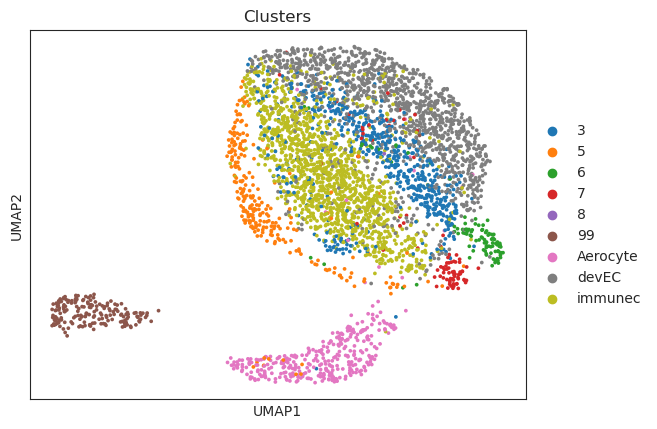

IMMUNEEC:


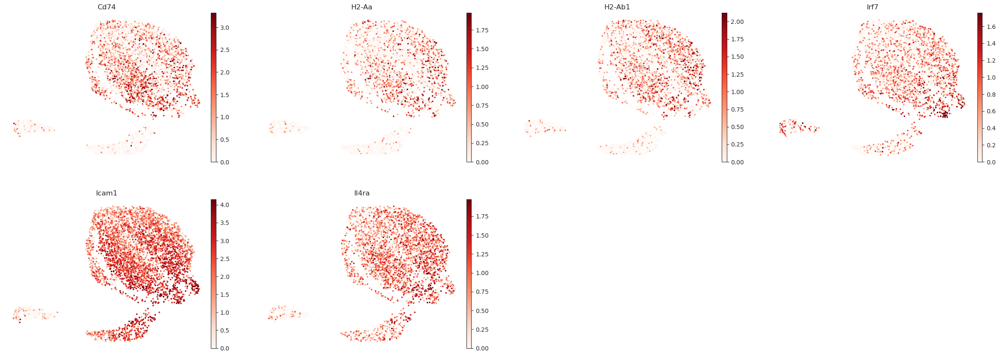





DEVEC:


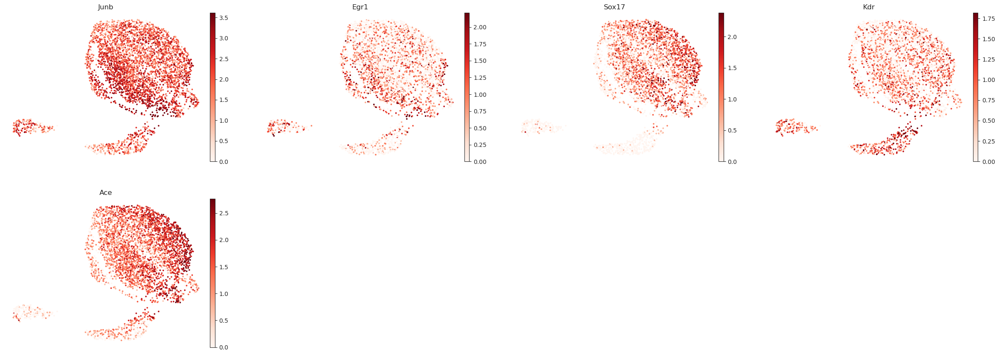





AEROCYTE:


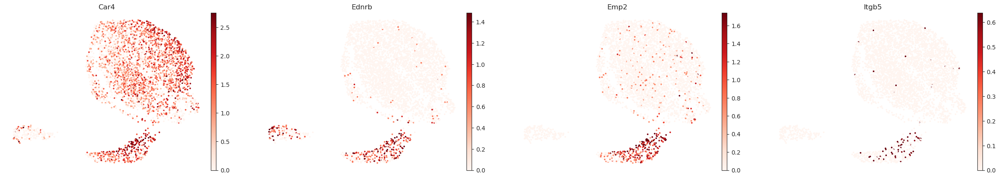





PROEC:


KeyError: 'Could not find key Tk1 in .var_names or .obs.columns.'

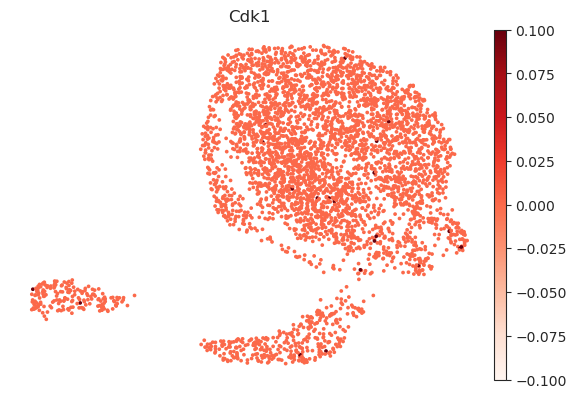

In [56]:
sc.pl.umap(adata_obj,color = "Clusters")
for ct in marker_genes.keys():
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata_obj,
        color=marker_genes[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")


    
sc.pl.umap(
        adata_obj,
        color=["Aplnr", "Apln"],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )   

The figure above shows the expression of Marker genes for AEROCYTES IMMUNEC AND DEVEC groups. 
Aplnr and Apln are also added. 



/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/n

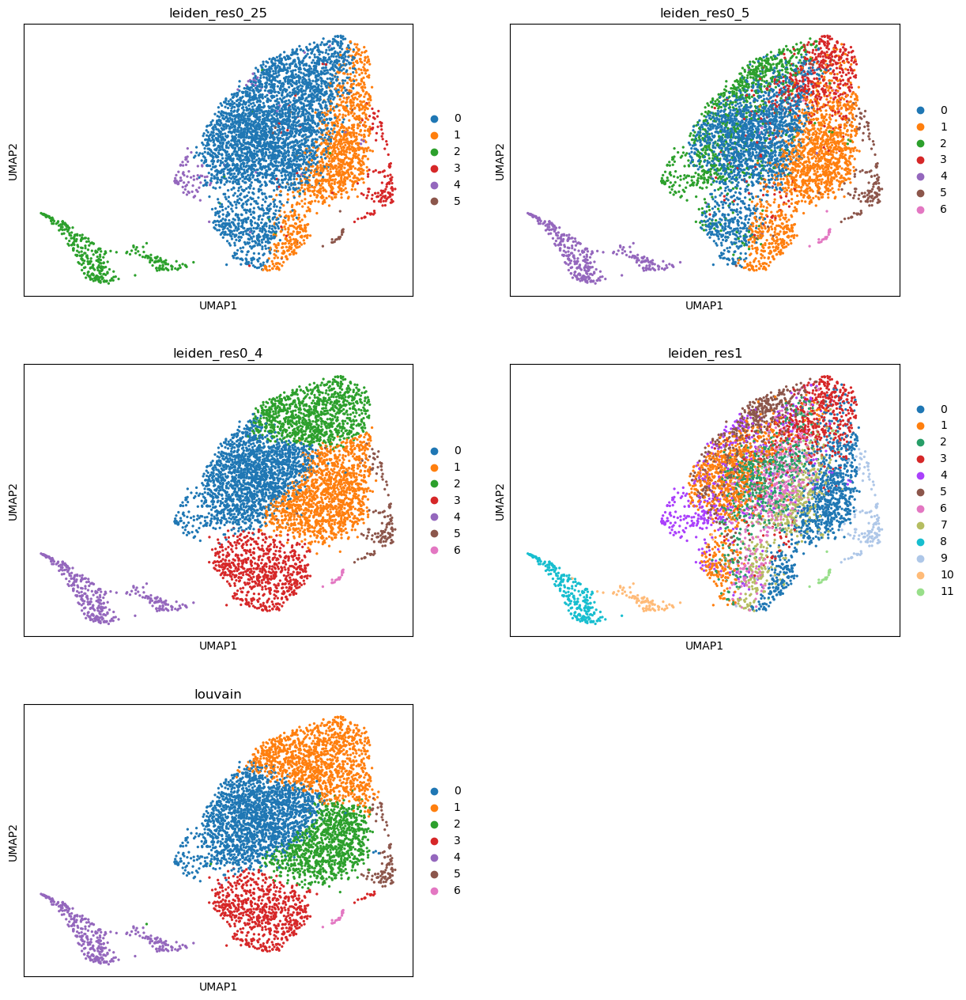

In [129]:
sc.tl.louvain(adata_obj,resolution=0.4,)
sc.tl.leiden(adata_obj,resolution=0.4, key_added="leiden_res0_4")
sc.pl.umap(
    adata_obj,
    color=["leiden_res0_25", "leiden_res0_5","leiden_res0_4", "leiden_res1", "louvain"], ncols = 2
)

Test of various clustering settings -> However we used clustering provided by the authors


In [175]:
sc.tl.rank_genes_groups(
    adata_obj, groupby="Clusters", method="wilcoxon", key_added = "dea_clusters"
)

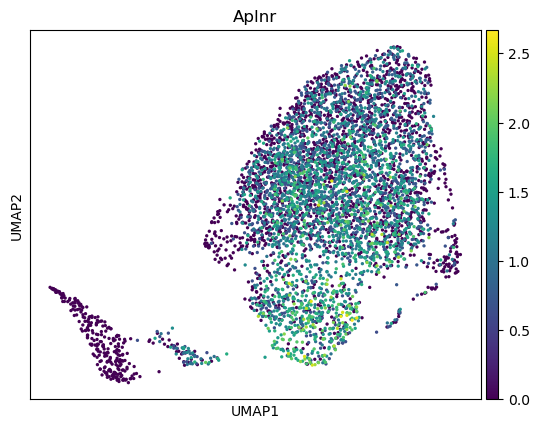

In [163]:
sc.pl.umap(
    adata_obj,
    color=["Aplnr"], ncols = 2
)

In [167]:
 adata_obj.obs["Clusters"] == "5"
    

cell_id
Day7_AAACCTGAGAAGGTGA-1    False
Day7_AAACCTGAGCTAGTGG-1     True
Day7_AAACCTGAGGCCGAAT-1    False
Day7_AAACCTGAGGGTTTCT-1    False
Day7_AAACCTGAGGTCATCT-1    False
                           ...  
Day7_TTTGTCATCATGTAGC-1    False
Day7_TTTGTCATCCAGTATG-1    False
Day7_ACGCAGCGTCATCCCT-1    False
Day7_CGGGTCATCAAACCAC-1    False
Day7_GTCTCGTCACATGGGA-1    False
Name: Clusters, Length: 5217, dtype: bool

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


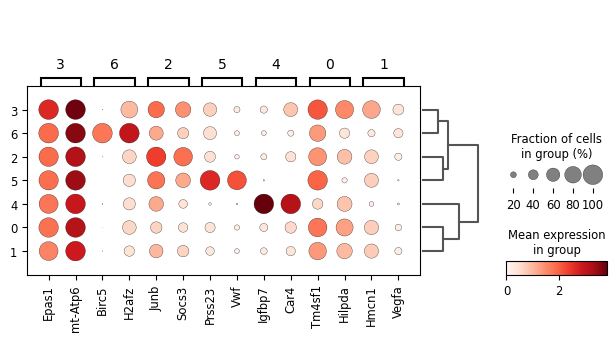

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


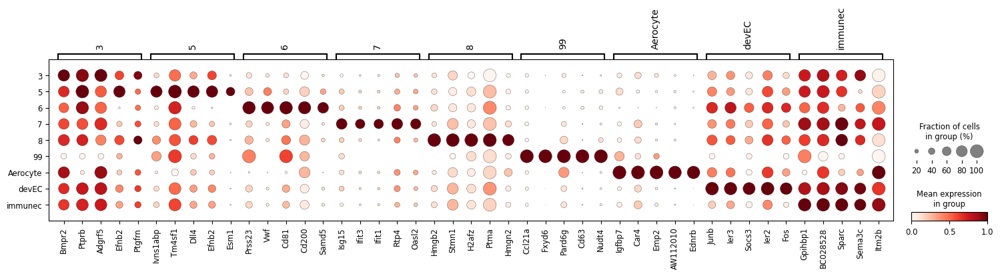

In [177]:
sc.pl.rank_genes_groups_dotplot(
    adata_obj, groupby="Clusters", standard_scale="var", n_genes=5, key="dea_clusters", dendrogram = False)


Top Differentially expressed genes for the cluster groups + the three subgroup. 
Group 99 are cells not present in the clustering provided. 

In [178]:
sc.tl.filter_rank_genes_groups(
    adata_obj,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_clusters",
    key_added="dea_clusters_filtered",
)


/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:661: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:661: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:661: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:661: RuntimeWarning: invalid value encountered in divide
  return n_nonzero / X.shape[0]
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:661: RuntimeWarning: invalid value

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


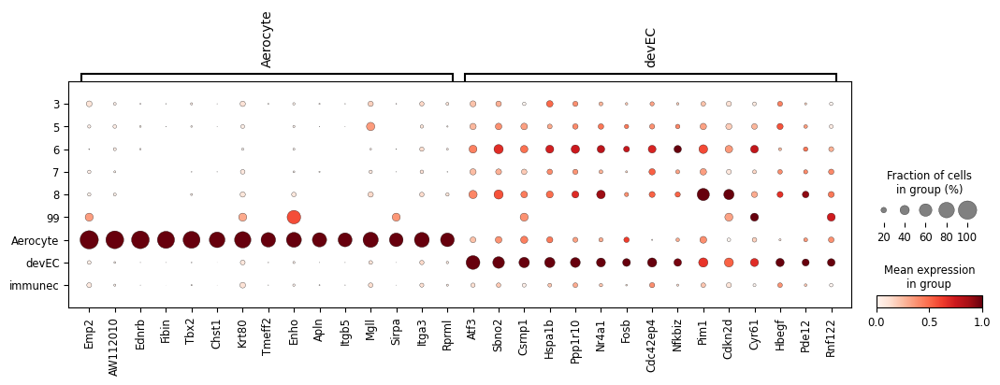

In [182]:
sc.pl.rank_genes_groups_dotplot(
    adata_obj,
    groups = ['Aerocyte', 'devEC', 'immunec'],
    groupby="Clusters",
    standard_scale="var",
    n_genes=15,
    key="dea_clusters_filtered",
    dendrogram = False
)


After filtering celar marker genes barely present, since they are not really unique. 

In [183]:
marker_genes = {"immuneEC": ["Cd74", "H2-Aa", "H2-Ab1"], "devEC": ["Junb", "Egr1", "Sox17"], "Aerocyte": ["Car4", "Ednrb", "Emp2", "Itgb5"]}

adata_basal.layers["counts"] = adata_basal.X
adata_basal.X = adata_basal.layers["scran_normalization"]
adata_basal.var["highly_variable"] = adata_basal.var["highly_deviant"]
sc.tl.pca(adata_basal, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata_basal)
sc.tl.umap(adata_basal)

IMMUNEEC:


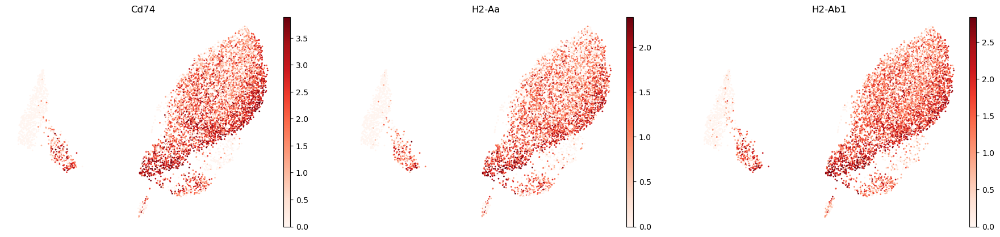





DEVEC:


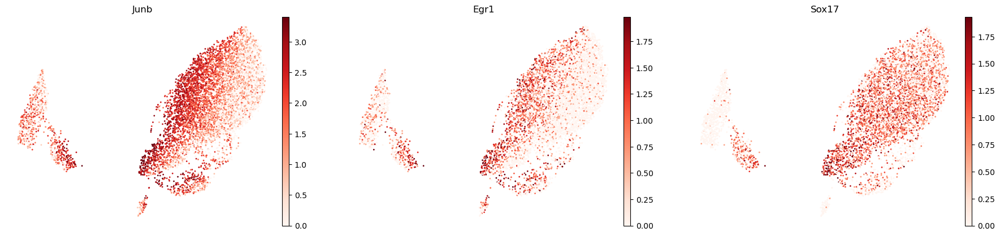





AEROCYTE:


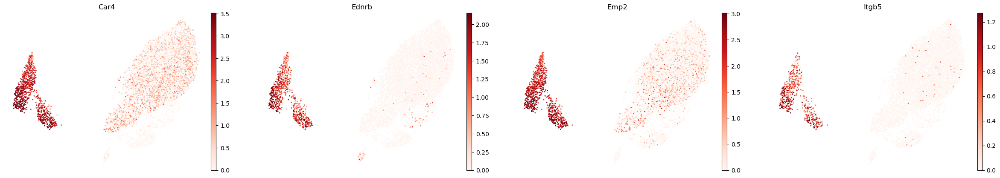

In [184]:
for ct in marker_genes.keys():
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata_basal,
        color=marker_genes[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")

In [185]:
dc.run_ora(
    mat=adata_obj,
    net=pd.concat([hallmarks, full_sen]),
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False
)



Running ora on mat with 5217 samples and 11739 targets for 53 sources.


100%|██████████| 5217/5217 [01:19<00:00, 65.65it/s] 


In [186]:
acts = dc.get_acts(adata_obj, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts



AnnData object with n_obs × n_vars = 5217 × 53
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'size_factors', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'Clusters', 'louvain', 'leiden_res0_4'
    var: 'mean', 'std'
    uns: 'leiden', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors', 'neighbors', 'pca', 'scDblFinder_class_colors', 'umap', 'Clusters_colors', 'dea_louvain', 'louvain', 'leiden_res0_4_colors', 'louvain_colors', 'rank_genes_groups', 'dendrogram_Clusters', 'dea_clusters', 'dea_louvain_2_filtered', 'dendrogram_louvain', 'dea_clusters_filtered'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


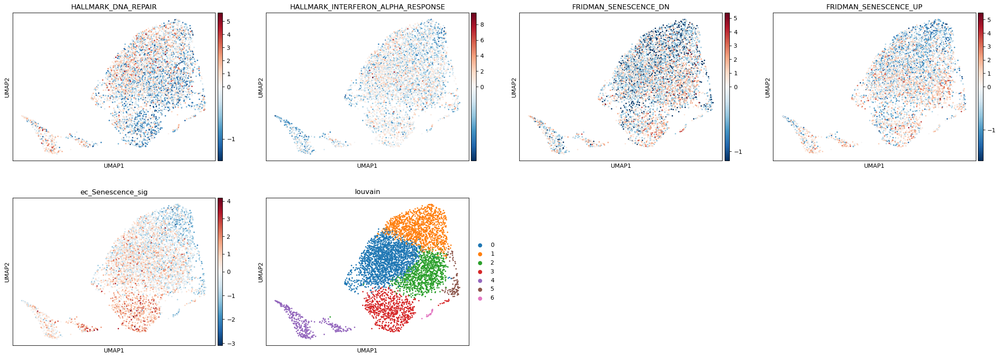

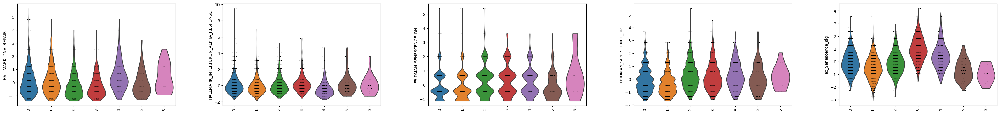

In [187]:
sc.pl.umap(acts, color=['HALLMARK_DNA_REPAIR', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 
                        'FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP', 'ec_Senescence_sig', 'louvain'], cmap='RdBu_r', vcenter=0)
sc.pl.violin(acts, keys=['HALLMARK_DNA_REPAIR', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 
                        'FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP', 'ec_Senescence_sig'], groupby='louvain', rotation=90)



### Tabula Muris SEnis Score DNA Damage

Now we import the tabula muris senis data and score the DNA damage on these data. 



In [188]:
senis_path = "/omics/odcf/analysis/OE0228_projects/VascularAging/rna_sequencing/public_scrnaseq/TabularMuris/senis_droplet_lung.h5ad"
import scanpy as sc
import seaborn as sns
adata_senis = sc.read_h5ad(senis_path)

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [189]:
adata_senis.layers
adata=adata_senis
col_name = "tabula_muris_senis"

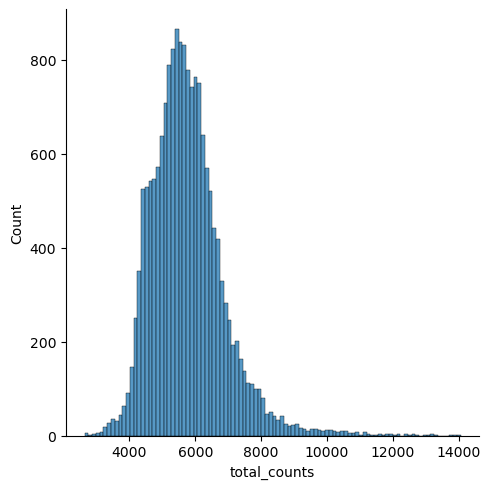

In [190]:
adata.var_names_make_unique
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("Rps", "Rpl"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^Hb[^(P)]"))
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)

p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False,)   

## What are we doing

We are attempting to replicate clustering results from https://insight.jci.org/articles/view/158079/figure/1 . 
Afterwards we want to perform DEA analysis. 

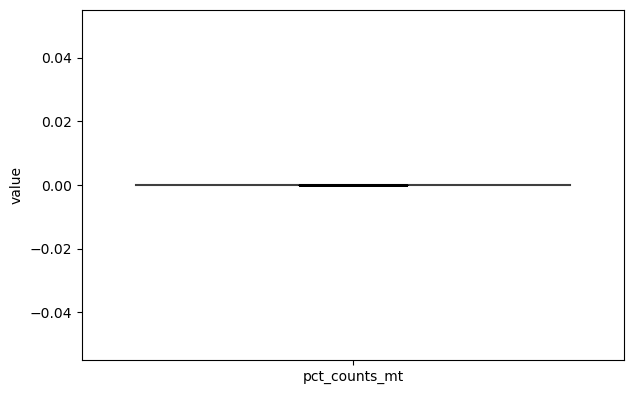

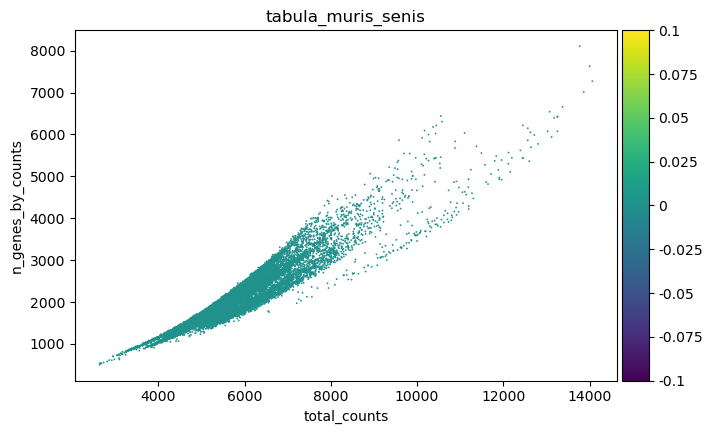

In [191]:
col_name = "tabula_muris_senis"
sc.pl.violin(adata, "pct_counts_mt", title=col_name)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", 
                       color="pct_counts_mt",title=col_name)

In [192]:
import numpy as np
from scipy.stats import median_abs_deviation
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier


adata.obs["outlier"] = (
        is_outlier(adata, "log1p_total_counts", 5)
        | is_outlier(adata, "log1p_n_genes_by_counts", 5)
        | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
    )
adata.obs.outlier.value_counts()
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
        adata.obs["pct_counts_mt"] > 8
    )
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

adata.obs.mt_outlier.value_counts()

Total number of cells: 17491
Number of cells after filtering of low quality cells: 17277


mt_outlier
False    17277
Name: count, dtype: int64

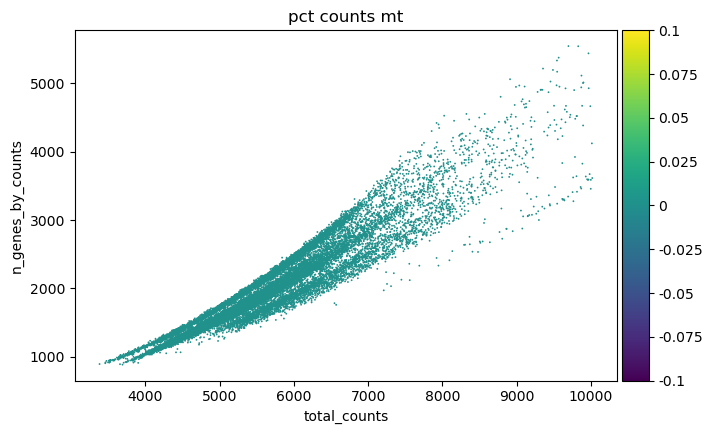

In [193]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")
sc.pp.filter_genes(adata, min_cells=20)

adata_senis

In [66]:
adata_senis.X.max()

10.0

In [202]:
sc.tl.umap(adata_senis)


/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


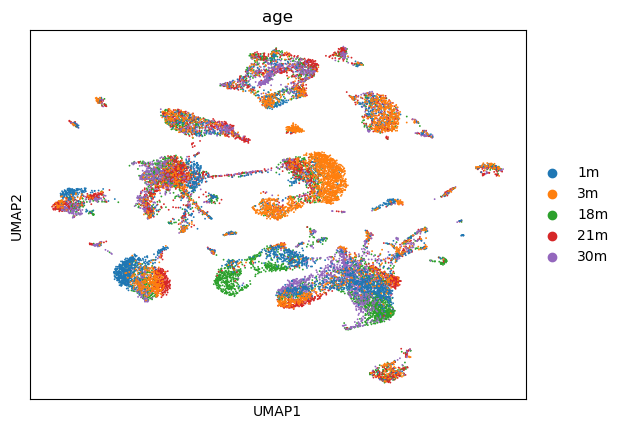

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


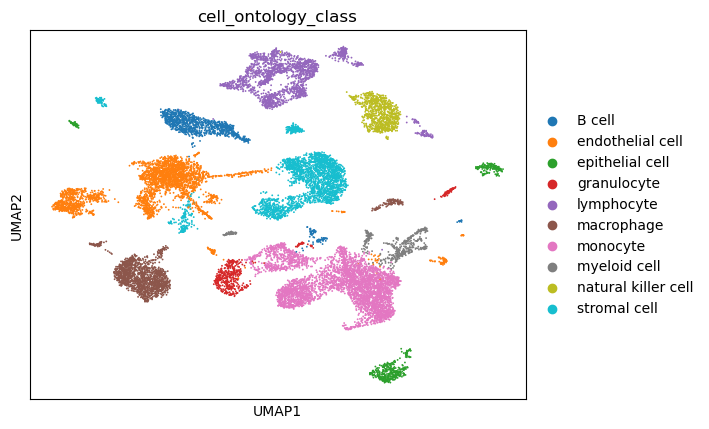

In [203]:
sc.pl.umap(adata_senis,color="age")
sc.pl.umap(adata_senis,color="cell_ontology_class")

UMAP is now run direcctly without any further processing from our side. 

Looks a bit different -> If this is an issue I can either pass the UMAP from cacoa to use that one. 

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


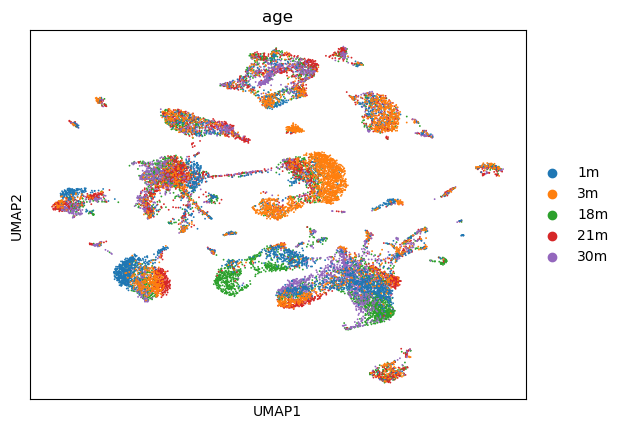

In [204]:
adata_senis

sc.pl.umap(adata_senis,color="age")

In [194]:
adata_senis

AnnData object with n_obs × n_vars = 17491 × 19860
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'cluster_names', 'leiden', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'distance

In [196]:
dc.run_ora(
    mat=adata_senis,
    net=pd.concat([hallmarks, full_sen]),
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False,
)



1584 features of mat are empty, they will be removed.
Running ora on mat with 17491 samples and 18276 targets for 53 sources.


100%|██████████| 17491/17491 [03:51<00:00, 75.43it/s] 
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


In [206]:
acts = dc.get_acts(adata_senis, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

# We can scale the obtained activities for better visualizations

acts



AnnData object with n_obs × n_vars = 17491 × 53
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'cluster_names', 'leiden', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    uns: 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'age_colors', 'binary_age_colors', 'cell_type_age_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_tsne', 'ora_estimate', 'ora_pvals'

In [207]:
acts.obs["binary_age"] = acts.obs["age"].isin(["3m", "1m"])
acts.obs.binary_age.replace({False: "aged", True: "young"}, inplace=True)
acts.obs["cell_type_age"] = acts.obs["binary_age"].astype(str) + "_" + acts.obs["cell_ontology_class"].astype(str)

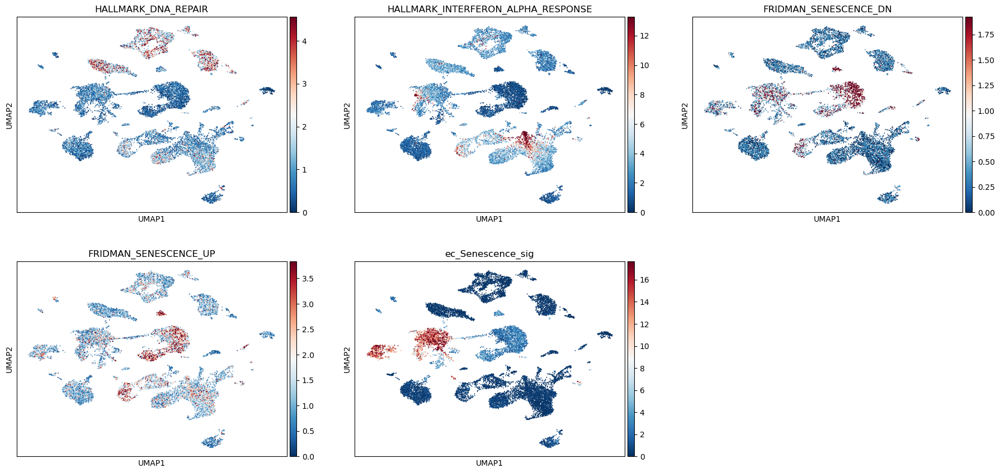

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


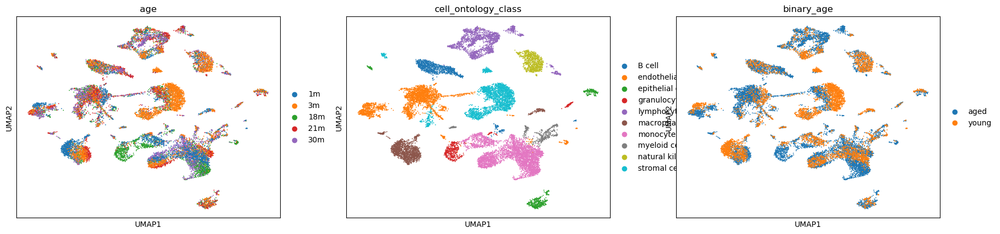

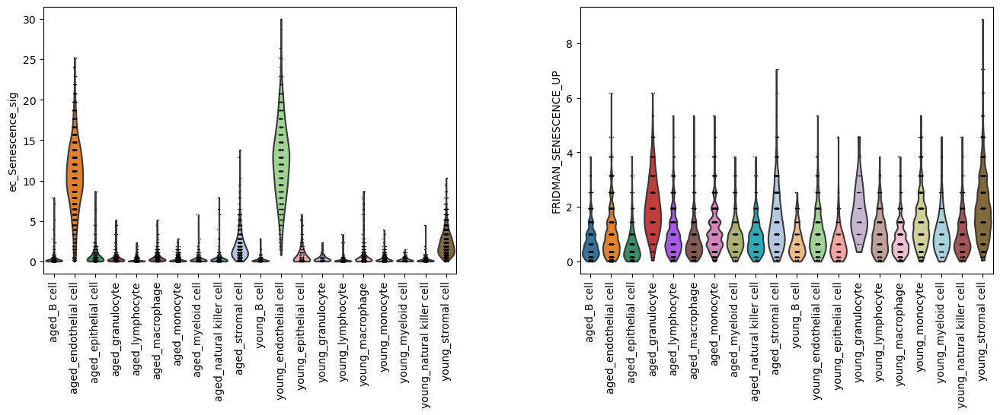

In [208]:
gs_of_interest = ['HALLMARK_DNA_REPAIR', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 
                        'FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP', 'ec_Senescence_sig']
sc.pl.umap(acts, color=gs_of_interest, cmap='RdBu_r',vmax = "p99",ncols=3)
sc.pl.umap(acts, color=["age","cell_ontology_class", "binary_age"])

sc.pl.violin(acts, keys=["ec_Senescence_sig","FRIDMAN_SENESCENCE_UP"], groupby='cell_type_age', rotation=90, multi_panel=True)


Here we score the Senescence sigatures between -> Showing that ec.SENESECENCE.SI is unique, but is higher in young cells when scoring with ORA.



In [200]:
acts.obs

,age,cell,cell_ontology_class,cell_ontology_id,free_annotation,method,mouse.id,n_genes,sex,subtissue,...,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier,mt_outlier,binary_age,cell_type_age
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGCGTAATA-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAACCTGAGCGTAATA,B cell,CL_0000236,B cell,droplet,18-F-50,2470,female,nan,...,397.529053,5.987781,6.255526,4.198922,1.648451,0.066074,False,False,aged,aged_B cell
AAACGGGTCGCCCTTA-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAACGGGTCGCCCTTA,B cell,CL_0000236,B cell,droplet,18-F-50,1821,female,nan,...,474.736816,6.164865,8.631481,0.000000,0.000000,0.000000,False,False,aged,aged_B cell
AAAGATGAGCAGACTG-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAAGATGAGCAGACTG,monocyte,CL_0000576,monocyte,droplet,18-F-50,1333,female,nan,...,415.146484,6.031037,9.478028,7.733735,2.167193,0.176566,False,False,aged,aged_monocyte
AAAGATGAGCCGTCGT-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAAGATGAGCCGTCGT,natural killer cell,CL_0000623,natural killer cell,droplet,18-F-50,1455,female,nan,...,449.550751,6.110471,9.219952,6.807537,2.055089,0.139618,False,False,aged,aged_natural killer cell
AAAGCAACATGGTAGG-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAAGCAACATGGTAGG,macrophage,CL_0000235,macrophage,droplet,18-F-50,3322,female,nan,...,361.613464,5.893337,4.923711,0.000000,0.000000,0.000000,False,False,aged,aged_macrophage
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10X_P8_13_TTTGGTTTCCTGTACC-1,3m,10X_P8_13_TTTGGTTTCCTGTACC,natural killer cell,CL_0000623,natural killer cell,droplet,3-M-7/8,1290,male,immune-endo-depleted,...,443.519012,6.096993,9.756251,2.126569,1.139936,0.046779,False,False,young,young_natural killer cell
10X_P8_13_TTTGTCAAGAGTCGGT-1,3m,10X_P8_13_TTTGTCAAGAGTCGGT,stromal cell,CL_0000499,stromal cell,droplet,3-M-7/8,1551,male,immune-endo-depleted,...,343.654755,5.842543,6.366857,2.243934,1.176787,0.041573,False,False,young,young_stromal cell
10X_P8_13_TTTGTCACATATGAGA-1,3m,10X_P8_13_TTTGTCACATATGAGA,stromal cell,CL_0000499,stromal cell,droplet,3-M-7/8,2623,male,immune-endo-depleted,...,362.555511,5.895932,4.887055,3.603525,1.526822,0.048574,False,False,young,young_stromal cell


In [209]:
df = dc.rank_sources_groups(acts, groupby='cell_type_age', reference='rest', method='t-test_overestim_var')
df


,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,aged_B cell,rest,HALLMARK_MYC_TARGETS_V1,22.813850,5.305352,1.050775e-100,5.569108e-99
1,aged_B cell,rest,HALLMARK_DNA_REPAIR,14.448296,0.780079,1.163142e-44,4.742039e-44
2,aged_B cell,rest,HALLMARK_UNFOLDED_PROTEIN_RESPONSE,13.263210,0.822975,2.277020e-38,7.542628e-38
3,aged_B cell,rest,HALLMARK_ALLOGRAFT_REJECTION,12.420664,1.368706,7.833886e-34,1.977124e-33
4,aged_B cell,rest,HALLMARK_MYC_TARGETS_V2,10.893301,0.858567,1.345217e-26,2.970687e-26
...,...,...,...,...,...,...,...
1055,young_stromal cell,rest,HALLMARK_INTERFERON_ALPHA_RESPONSE,-32.217909,-2.167946,8.750237e-184,4.216023e-183
1056,young_stromal cell,rest,HALLMARK_INTERFERON_GAMMA_RESPONSE,-32.407455,-2.315344,1.387511e-184,7.353806e-184
1057,young_stromal cell,rest,HALLMARK_MYC_TARGETS_V1,-34.456411,-3.799970,1.267289e-204,7.462922e-204
1058,young_stromal cell,rest,HALLMARK_OXIDATIVE_PHOSPHORYLATION,-38.781347,-3.034839,1.922557e-251,1.455650e-250


In [210]:
n_markers = 5
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers



{'aged_B cell': ['HALLMARK_MYC_TARGETS_V1',
  'HALLMARK_DNA_REPAIR',
  'HALLMARK_UNFOLDED_PROTEIN_RESPONSE',
  'HALLMARK_ALLOGRAFT_REJECTION',
  'HALLMARK_MYC_TARGETS_V2'],
 'aged_endothelial cell': ['ec_Senescence_sig',
  'HALLMARK_APICAL_JUNCTION',
  'HALLMARK_WNT_BETA_CATENIN_SIGNALING',
  'HALLMARK_TGF_BETA_SIGNALING',
  'FRIDMAN_SENESCENCE_DN'],
 'aged_epithelial cell': ['HALLMARK_ESTROGEN_RESPONSE_EARLY',
  'HALLMARK_CHOLESTEROL_HOMEOSTASIS',
  'HALLMARK_ESTROGEN_RESPONSE_LATE',
  'HALLMARK_KRAS_SIGNALING_DN',
  'HALLMARK_XENOBIOTIC_METABOLISM'],
 'aged_granulocyte': ['HALLMARK_APOPTOSIS',
  'HALLMARK_TNFA_SIGNALING_VIA_NFKB',
  'HALLMARK_IL6_JAK_STAT3_SIGNALING',
  'HALLMARK_INFLAMMATORY_RESPONSE',
  'HALLMARK_HYPOXIA'],
 'aged_lymphocyte': ['HALLMARK_ALLOGRAFT_REJECTION',
  'HALLMARK_MYC_TARGETS_V1',
  'HALLMARK_MYC_TARGETS_V2',
  'HALLMARK_DNA_REPAIR',
  'HALLMARK_IL2_STAT5_SIGNALING'],
 'aged_macrophage': ['HALLMARK_BILE_ACID_METABOLISM',
  'HALLMARK_ESTROGEN_RESPONSE_LATE',


/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


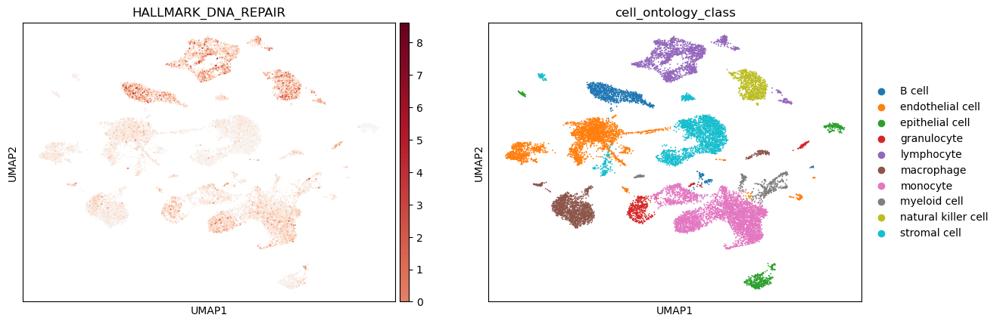

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


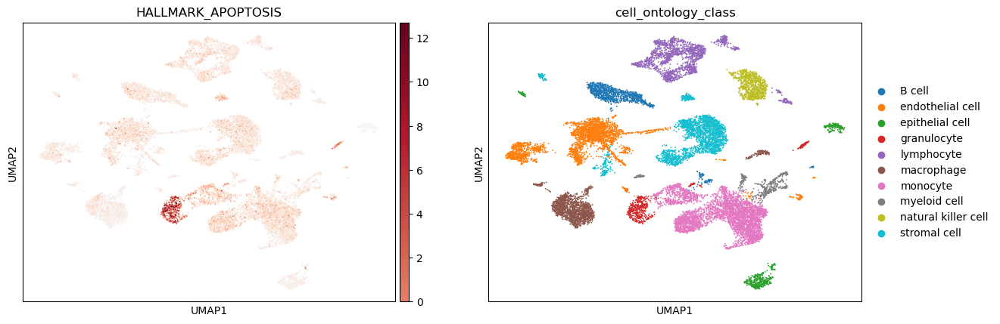

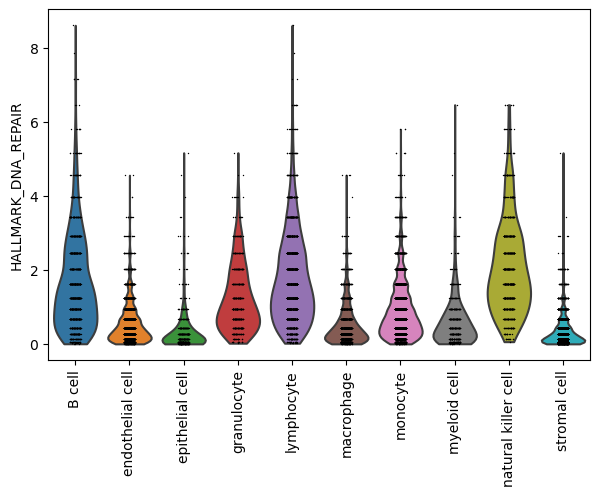

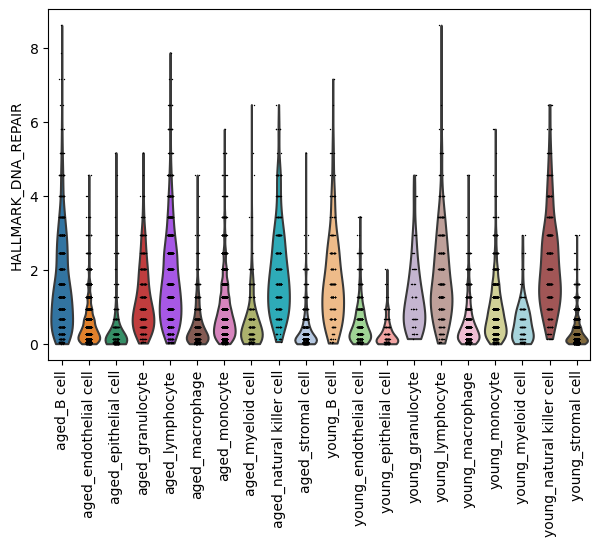

In [211]:
sc.pl.umap(acts, color=['HALLMARK_DNA_REPAIR', 'cell_ontology_class'], cmap='RdBu_r', vcenter=0)
sc.pl.umap(acts, color=['HALLMARK_APOPTOSIS', 'cell_ontology_class'], cmap='RdBu_r', vcenter=0)
sc.pl.violin(acts, keys=['HALLMARK_DNA_REPAIR'], groupby='cell_ontology_class', rotation=90)
sc.pl.violin(acts, keys=['HALLMARK_DNA_REPAIR'], groupby='cell_type_age', rotation=90)

Here we look at DNA repair processes and see a cell type specific activitiy of these. 

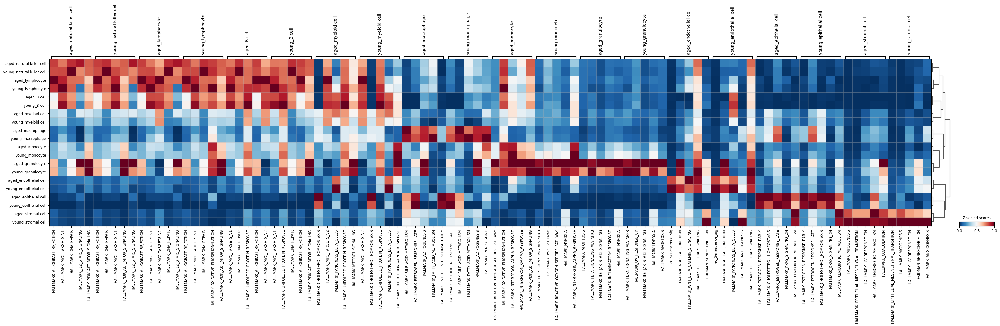

In [212]:
sc.pl.matrixplot(acts, source_markers, 'cell_type_age', dendrogram=True,standard_scale="var",
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')

The Matrixplot helps us check on the general structure of the cells

-> Myeloid and immune cell types show distinct signatures from the tissue cell types.

Zoioming in on the endothelial cells

## 

### Running with AUcell

In [214]:
dc.run_aucell(
    mat=adata_senis,
    net=pd.concat([hallmarks, full_sen]),
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False,
)



1584 features of mat are empty, they will be removed.
Running aucell on mat with 17491 samples and 18276 targets for 53 sources.


In [215]:
acts = dc.get_acts(adata_senis, obsm_key='aucell_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

# We can scale the obtained activities for better visualizations

acts



AnnData object with n_obs × n_vars = 17491 × 53
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'cluster_names', 'leiden', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    uns: 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'rank_genes_groups', 'age_colors', 'binary_age_colors', 'cell_type_age_colors', 'umap', 'dendrogram_cell_type_age'
    obsm: 'X_pca', 'X_umap', 'X_tsne', 'ora_estimate', 'ora_pvals', 'aucell_estimate'

In [216]:
acts.obs["binary_age"] = acts.obs["age"].isin(["3m", "1m"])
acts.obs.binary_age.replace({False: "aged", True: "young"}, inplace=True)
acts.obs["cell_type_age"] = acts.obs["binary_age"].astype(str) + "_" + acts.obs["cell_ontology_class"].astype(str)

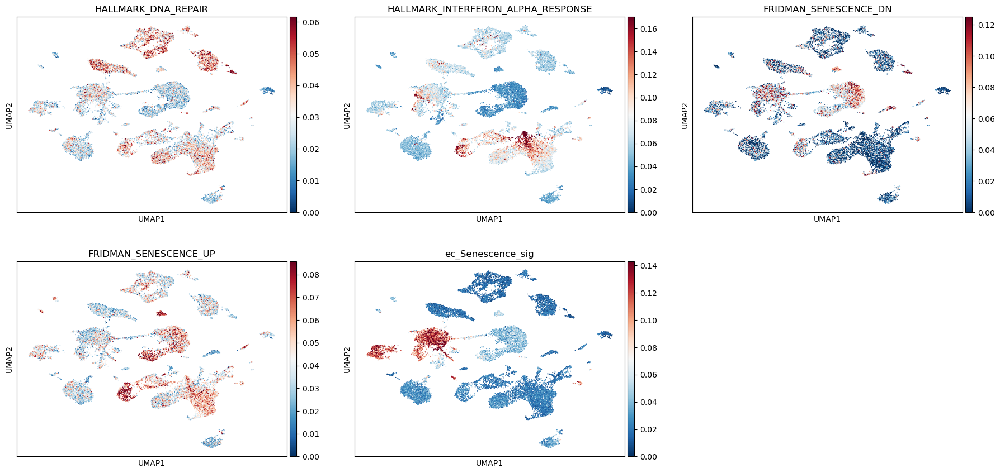

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


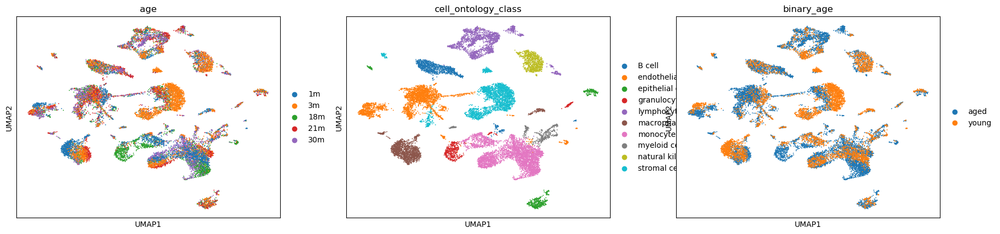

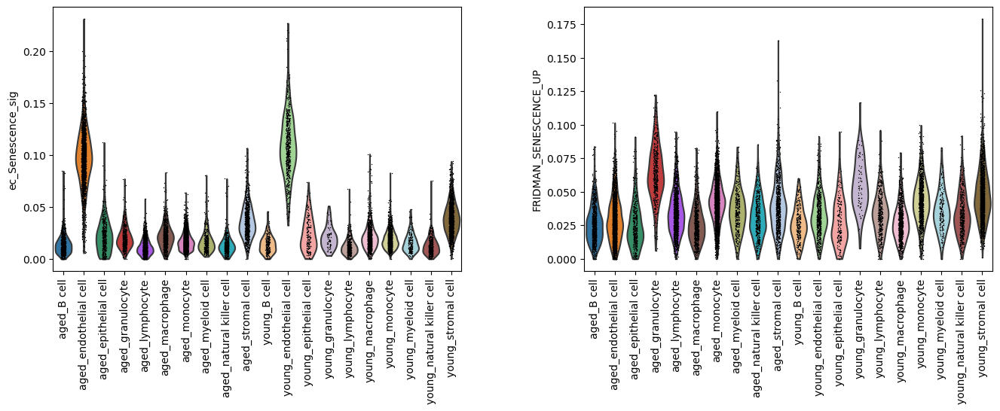

In [217]:
gs_of_interest = ['HALLMARK_DNA_REPAIR', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 
                        'FRIDMAN_SENESCENCE_DN', 'FRIDMAN_SENESCENCE_UP', 'ec_Senescence_sig']
sc.pl.umap(acts, color=gs_of_interest, cmap='RdBu_r',vmax = "p99",ncols=3)
sc.pl.umap(acts, color=["age","cell_ontology_class", "binary_age"])

sc.pl.violin(acts, keys=["ec_Senescence_sig","FRIDMAN_SENESCENCE_UP"], groupby='cell_type_age', rotation=90, multi_panel=True)


Here we score the Senescence sigatures between -> Showing that ec.SENESECENCE.SI is unique, but is higher in young cells when scoring with ORA.



In [219]:
acts.obs

,age,cell,cell_ontology_class,cell_ontology_id,free_annotation,method,mouse.id,n_genes,sex,subtissue,...,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier,mt_outlier,binary_age,cell_type_age
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGCGTAATA-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAACCTGAGCGTAATA,B cell,CL_0000236,B cell,droplet,18-F-50,2470,female,nan,...,397.529053,5.987781,6.255526,4.198922,1.648451,0.066074,False,False,aged,aged_B cell
AAACGGGTCGCCCTTA-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAACGGGTCGCCCTTA,B cell,CL_0000236,B cell,droplet,18-F-50,1821,female,nan,...,474.736816,6.164865,8.631481,0.000000,0.000000,0.000000,False,False,aged,aged_B cell
AAAGATGAGCAGACTG-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAAGATGAGCAGACTG,monocyte,CL_0000576,monocyte,droplet,18-F-50,1333,female,nan,...,415.146484,6.031037,9.478028,7.733735,2.167193,0.176566,False,False,aged,aged_monocyte
AAAGATGAGCCGTCGT-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAAGATGAGCCGTCGT,natural killer cell,CL_0000623,natural killer cell,droplet,18-F-50,1455,female,nan,...,449.550751,6.110471,9.219952,6.807537,2.055089,0.139618,False,False,aged,aged_natural killer cell
AAAGCAACATGGTAGG-1-11-0-0,18m,MACA_18m_F_LUNG_50_AAAGCAACATGGTAGG,macrophage,CL_0000235,macrophage,droplet,18-F-50,3322,female,nan,...,361.613464,5.893337,4.923711,0.000000,0.000000,0.000000,False,False,aged,aged_macrophage
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10X_P8_13_TTTGGTTTCCTGTACC-1,3m,10X_P8_13_TTTGGTTTCCTGTACC,natural killer cell,CL_0000623,natural killer cell,droplet,3-M-7/8,1290,male,immune-endo-depleted,...,443.519012,6.096993,9.756251,2.126569,1.139936,0.046779,False,False,young,young_natural killer cell
10X_P8_13_TTTGTCAAGAGTCGGT-1,3m,10X_P8_13_TTTGTCAAGAGTCGGT,stromal cell,CL_0000499,stromal cell,droplet,3-M-7/8,1551,male,immune-endo-depleted,...,343.654755,5.842543,6.366857,2.243934,1.176787,0.041573,False,False,young,young_stromal cell
10X_P8_13_TTTGTCACATATGAGA-1,3m,10X_P8_13_TTTGTCACATATGAGA,stromal cell,CL_0000499,stromal cell,droplet,3-M-7/8,2623,male,immune-endo-depleted,...,362.555511,5.895932,4.887055,3.603525,1.526822,0.048574,False,False,young,young_stromal cell


In [220]:
df = dc.rank_sources_groups(acts, groupby='cell_type_age', reference='rest', method='t-test_overestim_var')
df


,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,aged_B cell,rest,HALLMARK_MYC_TARGETS_V1,25.094547,0.024457,4.449340e-119,2.358150e-117
1,aged_B cell,rest,HALLMARK_MYC_TARGETS_V2,13.332790,0.018545,1.225400e-38,4.059137e-38
2,aged_B cell,rest,HALLMARK_UNFOLDED_PROTEIN_RESPONSE,12.436186,0.008673,3.872878e-34,1.026313e-33
3,aged_B cell,rest,HALLMARK_ALLOGRAFT_REJECTION,11.492272,0.009949,3.515991e-29,8.873692e-29
4,aged_B cell,rest,HALLMARK_DNA_REPAIR,10.882085,0.006725,9.107095e-27,2.193982e-26
...,...,...,...,...,...,...,...
1055,young_stromal cell,rest,HALLMARK_INTERFERON_GAMMA_RESPONSE,-43.476366,-0.025340,3.539998e-302,1.876199e-301
1056,young_stromal cell,rest,HALLMARK_INTERFERON_ALPHA_RESPONSE,-47.726476,-0.038151,0.000000e+00,0.000000e+00
1057,young_stromal cell,rest,HALLMARK_OXIDATIVE_PHOSPHORYLATION,-48.990690,-0.025467,0.000000e+00,0.000000e+00
1058,young_stromal cell,rest,HALLMARK_MYC_TARGETS_V1,-53.298251,-0.030463,0.000000e+00,0.000000e+00


In [221]:
n_markers = 5
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers



{'aged_B cell': ['HALLMARK_MYC_TARGETS_V1',
  'HALLMARK_MYC_TARGETS_V2',
  'HALLMARK_UNFOLDED_PROTEIN_RESPONSE',
  'HALLMARK_ALLOGRAFT_REJECTION',
  'HALLMARK_DNA_REPAIR'],
 'aged_endothelial cell': ['ec_Senescence_sig',
  'HALLMARK_WNT_BETA_CATENIN_SIGNALING',
  'HALLMARK_PANCREAS_BETA_CELLS',
  'HALLMARK_COAGULATION',
  'HALLMARK_APICAL_JUNCTION'],
 'aged_epithelial cell': ['HALLMARK_ESTROGEN_RESPONSE_EARLY',
  'HALLMARK_KRAS_SIGNALING_DN',
  'HALLMARK_ESTROGEN_RESPONSE_LATE',
  'HALLMARK_CHOLESTEROL_HOMEOSTASIS',
  'HALLMARK_XENOBIOTIC_METABOLISM'],
 'aged_granulocyte': ['HALLMARK_IL6_JAK_STAT3_SIGNALING',
  'HALLMARK_TNFA_SIGNALING_VIA_NFKB',
  'HALLMARK_APOPTOSIS',
  'HALLMARK_UV_RESPONSE_UP',
  'HALLMARK_INFLAMMATORY_RESPONSE'],
 'aged_lymphocyte': ['HALLMARK_ALLOGRAFT_REJECTION',
  'HALLMARK_MYC_TARGETS_V1',
  'HALLMARK_IL2_STAT5_SIGNALING',
  'HALLMARK_MYC_TARGETS_V2',
  'HALLMARK_APICAL_SURFACE'],
 'aged_macrophage': ['HALLMARK_BILE_ACID_METABOLISM',
  'HALLMARK_ESTROGEN_RESPO

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


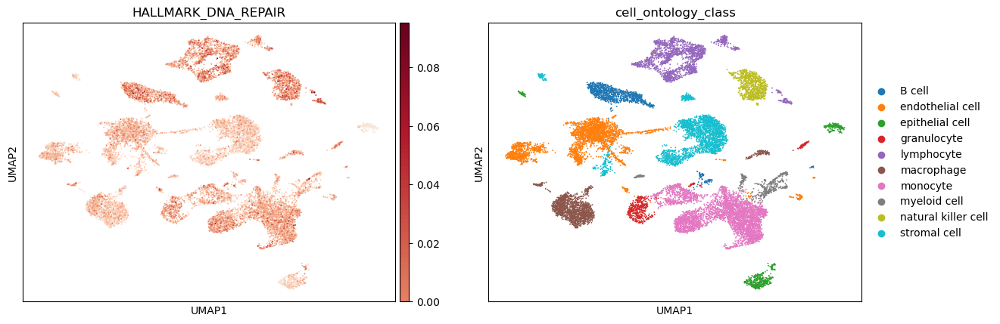

/omics/groups/OE0436/internal/heyer/conda/envs/new_scanpy/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


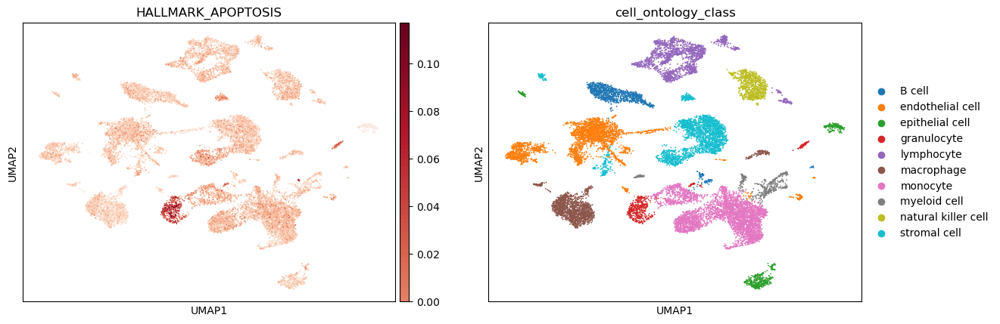

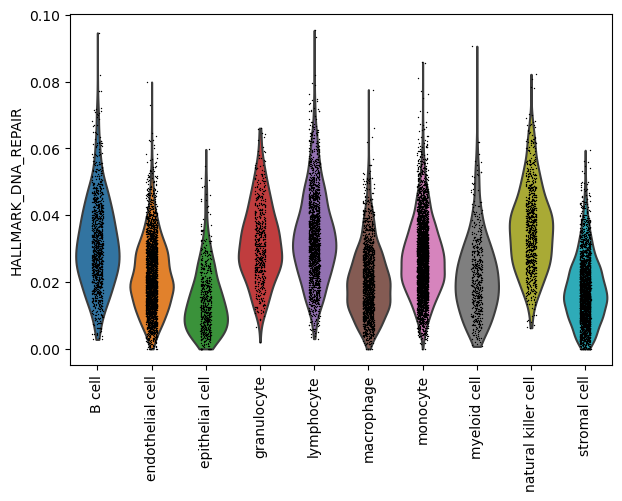

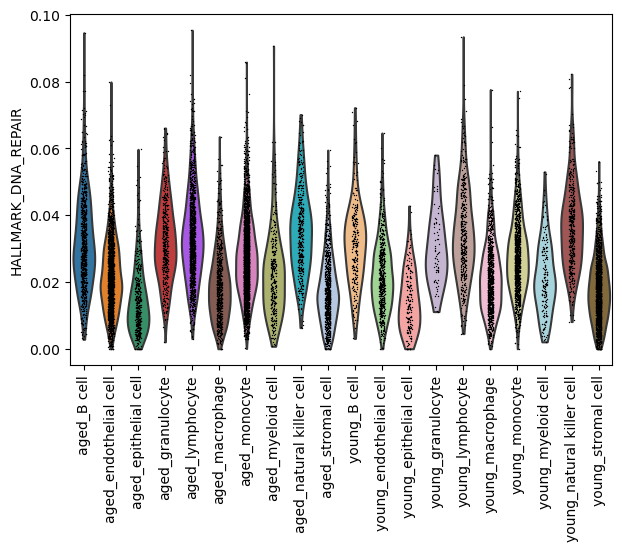

In [222]:
sc.pl.umap(acts, color=['HALLMARK_DNA_REPAIR', 'cell_ontology_class'], cmap='RdBu_r', vcenter=0)
sc.pl.umap(acts, color=['HALLMARK_APOPTOSIS', 'cell_ontology_class'], cmap='RdBu_r', vcenter=0)
sc.pl.violin(acts, keys=['HALLMARK_DNA_REPAIR'], groupby='cell_ontology_class', rotation=90)
sc.pl.violin(acts, keys=['HALLMARK_DNA_REPAIR'], groupby='cell_type_age', rotation=90)

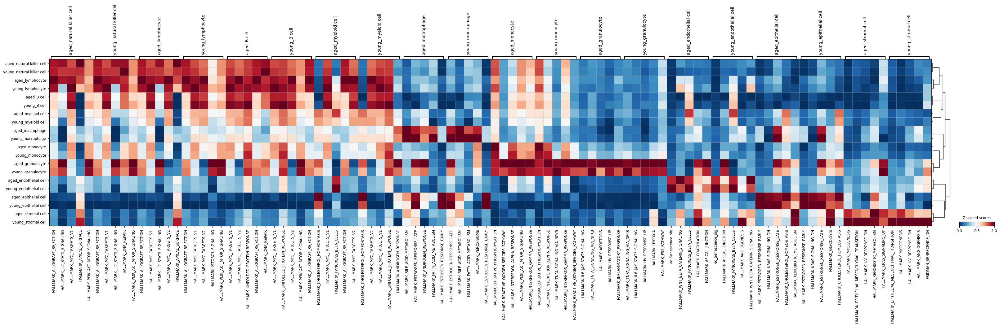

In [223]:
sc.pl.matrixplot(acts, source_markers, 'cell_type_age', dendrogram=True,standard_scale="var",
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')